In [ ]:
import pandas as pd
import firebase_admin
from firebase_admin import credentials, firestore
import matplotlib.pyplot as plt
import numpy as np
import os
import requests
import pickle
import torch
from sklearn.model_selection import StratifiedShuffleSplit
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset


## Getting data

In [42]:
# Initialize Firebase Admin SDK with your service account credentials
cred = credentials.Certificate("/Users/namihosono/Downloads/rate-logos-60d0a14673c5.json")
firebase_admin.initialize_app(cred)


# Create a reference to the Firestore database
db = firestore.client()

# Reference to your Firestore collection
collection_ref = db.collection("animations_new")

# Get documents from the collection
documents = collection_ref.stream()

# Create a list to store data
data = []

# Iterate over documents and extract data
for doc in documents:
    data.append(doc.to_dict())

# Create a DataFrame from the data
df = pd.DataFrame(data)

# Display the DataFrame
print(df)

      rating alias       filename    id                             time  \
0          4           logo_0.svg     0 2024-02-28 20:37:35.310000+00:00   
1          0        logo_3555.svg     1 2024-02-28 20:38:55.975000+00:00   
2          0        logo_4597.svg    10 2024-02-28 20:40:17.609000+00:00   
3          0         logo_975.svg   100 2024-02-28 22:35:09.303000+00:00   
4          0        logo_3578.svg  1000 2024-03-01 11:13:04.844000+00:00   
...      ...   ...            ...   ...                              ...   
4176       0        logo_3952.svg   995 2024-03-01 11:12:41.487000+00:00   
4177       0         logo_970.svg   996 2024-03-01 11:12:44.772000+00:00   
4178       0        logo_4944.svg   997 2024-03-01 11:12:48.294000+00:00   
4179       0         logo_149.svg   998 2024-03-01 11:12:53.969000+00:00   
4180       2        logo_3066.svg   999 2024-03-01 11:13:00.958000+00:00   

                                                   data  
0     0,0,0,1,0,0,0,0,0,0,0,0

array([[<Axes: title={'center': 'rating'}>]], dtype=object)

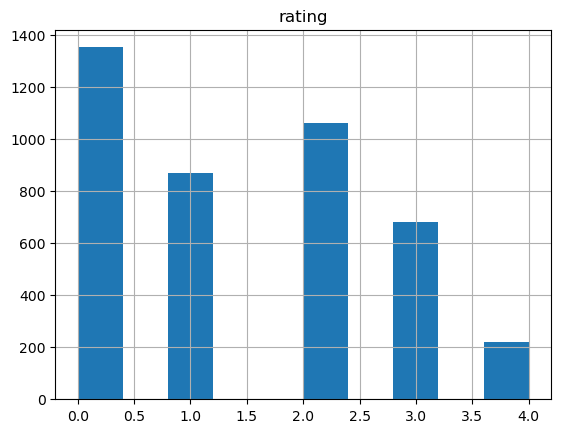

In [44]:
df.hist(column='rating')

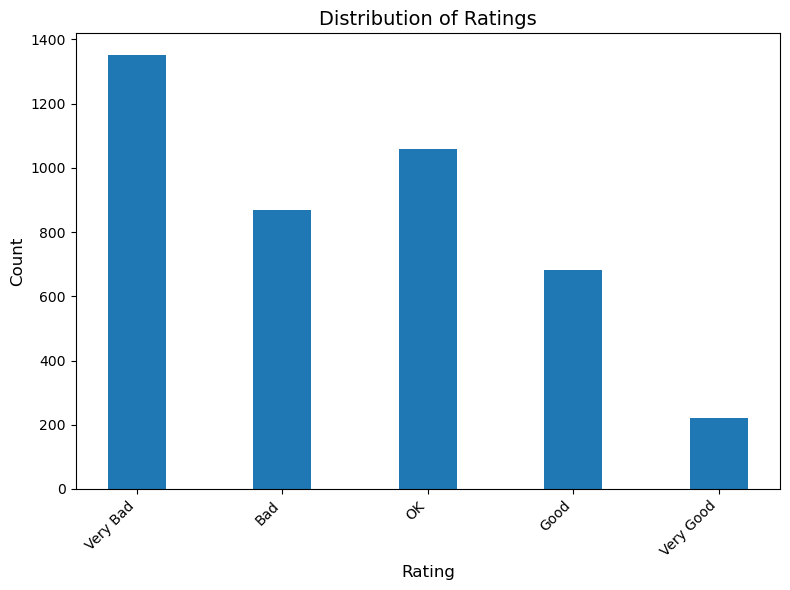

In [47]:
# Define custom labels and corresponding values
labels = ['Very Bad', 'Bad', 'OK', 'Good', 'Very Good']
values = np.arange(5)

# Plot histogram
plt.figure(figsize=(8, 6))
plt.bar(values, df['rating'].value_counts().sort_index(), width=0.4, align='center')

# Customize labels and ticks
plt.xlabel('Rating', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(values, labels, rotation=45, ha='right', fontsize=10)

# Show plot
plt.title('Distribution of Ratings', fontsize=14)
plt.tight_layout()
plt.show()


In [241]:
df['rating'].value_counts()

0    1351
2    1059
1     868
3     682
4     221
Name: rating, dtype: int64

In [242]:
# saving the data in a csv file

df.to_csv('data/test_2/test_rating.csv', index=False)

## Importing the embedded path

In [243]:
# Specify the path to your text file
file_path = 'src/data_scraper/results_shuffled.txt'

# Open the file in read mode ('r')
with open(file_path, 'r') as file:
    # Read the entire content of the file
    all_logos = file.read()

# Print 
print(all_logos)

logo_0.svg;https://cdn.worldvectorlogo.com/logos/keithley.svg
logo_1.svg;https://cdn.worldvectorlogo.com/logos/trade-uk.svg
logo_2.svg;https://cdn.worldvectorlogo.com/logos/flaix-fm.svg
logo_3.svg;https://cdn.worldvectorlogo.com/logos/amav.svg
logo_4.svg;https://cdn.worldvectorlogo.com/logos/chelsea-gca-realty.svg
logo_5.svg;https://cdn.worldvectorlogo.com/logos/platform-evc.svg
logo_6.svg;https://cdn.worldvectorlogo.com/logos/purolator-courier.svg
logo_7.svg;https://cdn.worldvectorlogo.com/logos/gramercy-pictures.svg
logo_8.svg;https://cdn.worldvectorlogo.com/logos/hall-mark.svg
logo_9.svg;https://cdn.worldvectorlogo.com/logos/mark.svg
logo_10.svg;https://cdn.worldvectorlogo.com/logos/crest-1.svg
logo_11.svg;https://cdn.worldvectorlogo.com/logos/prolink-1.svg
logo_12.svg;https://cdn.worldvectorlogo.com/logos/convector.svg
logo_13.svg;https://cdn.worldvectorlogo.com/logos/lowes-companies-logo.svg
logo_14.svg;https://cdn.worldvectorlogo.com/logos/club-triumph.svg
logo_15.svg;https://cdn

In [244]:
# getting the logos in the labeled data

logos = df['filename']

animated_logos = []

for i in logos:
    #print(type(i))

    # Split the string into lines
    lines = all_logos.split('\n')

    # Find the line that includes the target string
    desired_line = next((line for line in lines if i in line), None)

    animated_logos.append(desired_line)

print(animated_logos)

['logo_0.svg;https://cdn.worldvectorlogo.com/logos/keithley.svg', 'logo_3555.svg;https://cdn.worldvectorlogo.com/logos/germs-and-ideas.svg', 'logo_4597.svg;https://cdn.worldvectorlogo.com/logos/orlando-solar-bears.svg', 'logo_975.svg;https://cdn.worldvectorlogo.com/logos/paintbox.svg', 'logo_3578.svg;https://cdn.worldvectorlogo.com/logos/mona-1.svg', 'logo_1509.svg;https://cdn.worldvectorlogo.com/logos/brian-little-counsellor.svg', 'logo_2309.svg;https://cdn.worldvectorlogo.com/logos/korean-violation-ticket-payment-by-proxy.svg', 'logo_2567.svg;https://cdn.worldvectorlogo.com/logos/anylogic-1.svg', 'logo_2388.svg;https://cdn.worldvectorlogo.com/logos/citrus-college.svg', 'logo_3922.svg;https://cdn.worldvectorlogo.com/logos/iggle-video.svg', 'logo_2123.svg;https://cdn.worldvectorlogo.com/logos/ceemas-99.svg', 'logo_4426.svg;https://cdn.worldvectorlogo.com/logos/united-engineers.svg', 'logo_4697.svg;https://cdn.worldvectorlogo.com/logos/jove.svg', 'logo_841.svg;https://cdn.worldvectorlog

In [245]:
len(animated_logos)

4181

In [246]:
# creating a txt file to prepare for preprocessing
# Specify the file path
file_path = 'data/test_animated_logos.txt'

# Open the file in write mode ('w')
with open(file_path, 'w') as file:
    # Write each element of the list to a new line
    for item in animated_logos:
        file.write(f"{item}\n")

In [247]:
# creating a svg file from the list of rated logos

def save_svg_from_url(url, save_path, new_name):
    # Make a request to the URL
    response = requests.get(url)
    
    # Check if the request was successful (status code 200)
    if response.status_code == 200:
        # Combine the save path and the new name
        file_path = os.path.join(save_path, new_name)

        # Save the content of the response to the file
        with open(file_path, "wb") as file:
            file.write(response.content)

        print(f"SVG saved successfully at: {file_path}")
    else:
        print(f"Failed to fetch SVG. Status Code: {response.status_code}")

# Example usage:
#url = "https://cdn.worldvectorlogo.com/logos/commissionaires-great-lakes-1.svg"
#save_path = "data/test/"
#new_name = "logo_1026"

#save_svg_from_url(url, save_path, new_name)

file_path = 'data/test_animated_logos.txt'

# Open the file in read mode ('r')
with open(file_path, 'r') as file:
    # Iterate through each line in the file
    for line in file:

        url = line.strip().split(";")[1]
        new_name = line.strip().split(";")[0]
        save_path = "data/test_6/raw_data/"

        save_svg_from_url(url, save_path, new_name)



SVG saved successfully at: data/test_6/raw_data/logo_0.svg
SVG saved successfully at: data/test_6/raw_data/logo_3555.svg
SVG saved successfully at: data/test_6/raw_data/logo_4597.svg
SVG saved successfully at: data/test_6/raw_data/logo_975.svg
SVG saved successfully at: data/test_6/raw_data/logo_3578.svg
SVG saved successfully at: data/test_6/raw_data/logo_1509.svg
SVG saved successfully at: data/test_6/raw_data/logo_2309.svg
SVG saved successfully at: data/test_6/raw_data/logo_2567.svg
SVG saved successfully at: data/test_6/raw_data/logo_2388.svg
SVG saved successfully at: data/test_6/raw_data/logo_3922.svg
SVG saved successfully at: data/test_6/raw_data/logo_2123.svg
SVG saved successfully at: data/test_6/raw_data/logo_4426.svg
SVG saved successfully at: data/test_6/raw_data/logo_4697.svg
SVG saved successfully at: data/test_6/raw_data/logo_841.svg
SVG saved successfully at: data/test_6/raw_data/logo_2240.svg
SVG saved successfully at: data/test_6/raw_data/logo_3280.svg
SVG saved suc

In [248]:
# preprocessing and getting the embedding

import src.preprocessing.preprocessing as preprocessing

preprocessing.compute_embedding_folder('data/test_2/raw_data/','src/preprocessing/deepsvg/deepsvg_models/deepSVG_hierarchical_ordered.pth.tar','data/test_2/embedded_data')


#preprocessing.compute_embedding()


File: logo_2860.svg
Embedding computed
File: logo_317.svg
Embedding computed
File: logo_465.svg
Embedding failed
File: logo_4593.svg
Embedding computed
File: logo_4587.svg
Embedding computed
File: logo_2690.svg
Embedding computed
File: logo_3565.svg
Embedding computed
File: logo_27.svg
Embedding computed
File: logo_1400.svg
Embedding computed
File: logo_1366.svg
Embedding computed
File: logo_3559.svg
Embedding computed
File: logo_2647.svg
Embedding computed
File: logo_2121.svg
Embedding computed
File: logo_2135.svg
Embedding computed
File: logo_4544.svg
Embedding failed
File: logo_4222.svg
Embedding computed
File: logo_2653.svg
Embedding computed
File: logo_673.svg
Embedding computed
File: logo_115.svg
Embedding computed
File: logo_4961.svg
Embedding failed
File: logo_667.svg
Embedding computed
File: logo_4949.svg
Embedding computed
File: logo_897.svg
Embedding computed
File: logo_4791.svg
Embedding computed
File: logo_3798.svg
Embedding computed
File: logo_2486.svg
Embedding computed


,animation_id,0,1,2,3,4,5,6,7,8,...,247,248,249,250,251,252,253,254,255,filename
0,0,-1.479738,1.499942,-0.460763,0.363093,-0.947988,-1.115443,1.581553,-0.411030,0.169418,...,1.718860,-0.139441,-1.523274,-1.602520,0.121774,-0.331636,1.083312,1.555735,0.406794,logo_2860.svg
1,1,-0.198556,0.946851,0.497889,-0.779701,-0.070278,-0.871111,0.403914,1.100798,-0.337577,...,-2.135782,0.779249,-0.337505,0.429480,-0.411051,2.071597,-0.557817,0.053835,-0.110260,logo_2860.svg
2,3,0.141129,1.822560,0.397646,0.658561,-1.421428,-1.602259,0.216757,0.756272,-1.212852,...,-1.516084,-1.266155,-1.031826,-0.137128,-0.715295,-1.437720,-0.900047,1.734579,2.157369,logo_2860.svg
3,2,0.989438,0.265805,2.549353,0.695821,-0.884728,-0.079114,0.200200,0.758521,-1.034282,...,0.970688,-0.900468,-0.504259,-0.915307,-0.481460,0.234924,-1.022180,1.685095,0.882979,logo_2860.svg
4,5,-0.157587,0.536932,0.361362,-0.021343,-0.385152,0.616863,-0.865314,0.770734,-0.353507,...,-1.172260,0.180233,-0.066151,1.415687,-0.415280,-0.704430,1.124239,-0.776726,0.313482,logo_2860.svg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,2,2.602998,0.105277,0.431186,0.461499,-0.115269,-0.601090,1.748284,-0.838251,-2.300453,...,-2.141240,-0.263298,0.458770,-0.421588,-0.274907,0.528911,-0.485262,0.655183,0.157396,logo_2845.svg
4,6,0.600467,-0.953958,1.383858,0.332371,-0.771961,1.697109,-0.696710,0.121463,-1.856164,...,-3.643596,-0.619941,2.032063,1.754028,-1.419798,-0.938256,-0.506410,0.519805,0.386747,logo_2845.svg
5,7,0.067460,-0.589226,0.617913,0.480502,-0.356936,-0.172417,-0.856492,0.443770,0.046097,...,-1.160495,0.001458,-0.146729,0.600957,-2.262814,0.616750,0.754633,0.180504,0.463179,logo_2845.svg
6,5,0.708957,0.174682,-0.676355,0.155469,-0.193522,1.579436,1.282503,0.676249,-0.947260,...,-2.811605,-1.557506,1.471285,0.912934,-0.075955,0.263248,0.148405,0.625602,-0.677965,logo_2845.svg


## Creating the SVG Embedding (Can skip)

In [221]:
# getting the 5000 logos 

logos = df['filename']

logos5000 = []

for i in range(5000):
    #print(type(i))

    # Split the string into lines
    lines = all_logos.split('\n')

    # Find the line that includes the target string
    desired_line = next((line for line in lines if str(i) in line), None)

    logos5000.append(desired_line)

print(logos5000)

['logo_0.svg;https://cdn.worldvectorlogo.com/logos/keithley.svg', 'logo_1.svg;https://cdn.worldvectorlogo.com/logos/trade-uk.svg', 'logo_2.svg;https://cdn.worldvectorlogo.com/logos/flaix-fm.svg', 'logo_3.svg;https://cdn.worldvectorlogo.com/logos/amav.svg', 'logo_4.svg;https://cdn.worldvectorlogo.com/logos/chelsea-gca-realty.svg', 'logo_5.svg;https://cdn.worldvectorlogo.com/logos/platform-evc.svg', 'logo_6.svg;https://cdn.worldvectorlogo.com/logos/purolator-courier.svg', 'logo_7.svg;https://cdn.worldvectorlogo.com/logos/gramercy-pictures.svg', 'logo_8.svg;https://cdn.worldvectorlogo.com/logos/hall-mark.svg', 'logo_9.svg;https://cdn.worldvectorlogo.com/logos/mark.svg', 'logo_10.svg;https://cdn.worldvectorlogo.com/logos/crest-1.svg', 'logo_11.svg;https://cdn.worldvectorlogo.com/logos/prolink-1.svg', 'logo_12.svg;https://cdn.worldvectorlogo.com/logos/convector.svg', 'logo_13.svg;https://cdn.worldvectorlogo.com/logos/lowes-companies-logo.svg', 'logo_14.svg;https://cdn.worldvectorlogo.com/lo

In [223]:
# creating a txt file to prepare for preprocessing
# Specify the file path
file_path = 'data/test_animated_logos2.txt'

# Open the file in write mode ('w')
with open(file_path, 'w') as file:
    # Write each element of the list to a new line
    for item in animated_logos:
        file.write(f"{item}\n")

In [224]:
# creating a svg file from the list of rated logos

def save_svg_from_url(url, save_path, new_name):
    # Make a request to the URL
    response = requests.get(url)
    
    # Check if the request was successful (status code 200)
    if response.status_code == 200:
        # Combine the save path and the new name
        file_path = os.path.join(save_path, new_name)

        # Save the content of the response to the file
        with open(file_path, "wb") as file:
            file.write(response.content)

        print(f"SVG saved successfully at: {file_path}")
    else:
        print(f"Failed to fetch SVG. Status Code: {response.status_code}")

# Example usage:
#url = "https://cdn.worldvectorlogo.com/logos/commissionaires-great-lakes-1.svg"
#save_path = "data/test/"
#new_name = "logo_1026"

#save_svg_from_url(url, save_path, new_name)

file_path = 'data/test_animated_logos2.txt'

# Open the file in read mode ('r')
with open(file_path, 'r') as file:
    # Iterate through each line in the file
    for line in file:

        url = line.strip().split(";")[1]
        new_name = line.strip().split(";")[0]
        save_path = "data/test/raw_data/"

        save_svg_from_url(url, save_path, new_name)

SVG saved successfully at: data/test/raw_data/logo_0.svg
SVG saved successfully at: data/test/raw_data/logo_3555.svg
SVG saved successfully at: data/test/raw_data/logo_4597.svg
SVG saved successfully at: data/test/raw_data/logo_975.svg
SVG saved successfully at: data/test/raw_data/logo_3578.svg
SVG saved successfully at: data/test/raw_data/logo_1509.svg
SVG saved successfully at: data/test/raw_data/logo_2309.svg
SVG saved successfully at: data/test/raw_data/logo_2567.svg
SVG saved successfully at: data/test/raw_data/logo_2388.svg
SVG saved successfully at: data/test/raw_data/logo_3922.svg
SVG saved successfully at: data/test/raw_data/logo_2123.svg
SVG saved successfully at: data/test/raw_data/logo_4426.svg
SVG saved successfully at: data/test/raw_data/logo_4697.svg
SVG saved successfully at: data/test/raw_data/logo_841.svg
SVG saved successfully at: data/test/raw_data/logo_2240.svg
SVG saved successfully at: data/test/raw_data/logo_3280.svg
SVG saved successfully at: data/test/raw_data

In [225]:
# preprocessing and getting the embedding

import src.preprocessing.preprocessing as preprocessing

preprocessing.compute_embedding_folder('data/test/raw_data/','src/preprocessing/deepsvg/deepsvg_models/deepSVG_hierarchical_ordered.pth.tar','data/test/embedded_data')


File: logo_2860.svg
Embedding computed
File: logo_317.svg
Embedding computed
File: logo_465.svg
Embedding failed
File: logo_2690.svg
Embedding computed
File: logo_3565.svg
Embedding computed
File: logo_27.svg
Embedding computed
File: logo_1366.svg
Embedding computed
File: logo_3559.svg
Embedding computed
File: logo_2647.svg
Embedding computed
File: logo_2121.svg
Embedding computed
File: logo_2135.svg
Embedding computed
File: logo_4222.svg
Embedding computed
File: logo_115.svg
Embedding computed
File: logo_667.svg
Embedding computed
File: logo_4791.svg
Embedding computed
File: logo_3798.svg
Embedding computed
File: logo_2492.svg
Embedding computed
File: logo_1825.svg
Embedding computed
File: logo_4785.svg
Embedding computed
File: logo_868.svg
Embedding computed
File: logo_1616.svg
Embedding computed
File: logo_3773.svg
Embedding computed
File: logo_3015.svg
Embedding computed
File: logo_3983.svg
Embedding computed
File: logo_2451.svg
Embedding computed
File: logo_707.svg
Embedding compu

,animation_id,0,1,2,3,4,5,6,7,8,...,247,248,249,250,251,252,253,254,255,filename
0,0,-1.479738,1.499942,-0.460763,0.363093,-0.947988,-1.115443,1.581553,-0.411030,0.169418,...,1.718860,-0.139441,-1.523274,-1.602520,0.121774,-0.331636,1.083312,1.555735,0.406794,logo_2860.svg
1,1,-0.198556,0.946851,0.497889,-0.779701,-0.070278,-0.871111,0.403914,1.100798,-0.337577,...,-2.135782,0.779249,-0.337505,0.429480,-0.411051,2.071597,-0.557817,0.053835,-0.110260,logo_2860.svg
2,3,0.141129,1.822560,0.397646,0.658561,-1.421428,-1.602259,0.216757,0.756272,-1.212852,...,-1.516084,-1.266155,-1.031826,-0.137128,-0.715295,-1.437720,-0.900047,1.734579,2.157369,logo_2860.svg
3,2,0.989438,0.265805,2.549353,0.695821,-0.884728,-0.079114,0.200200,0.758521,-1.034282,...,0.970688,-0.900468,-0.504259,-0.915307,-0.481460,0.234924,-1.022180,1.685095,0.882979,logo_2860.svg
4,5,-0.157587,0.536932,0.361362,-0.021343,-0.385152,0.616863,-0.865314,0.770734,-0.353507,...,-1.172260,0.180233,-0.066151,1.415687,-0.415280,-0.704430,1.124239,-0.776726,0.313482,logo_2860.svg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,2,2.602998,0.105277,0.431186,0.461499,-0.115269,-0.601090,1.748284,-0.838251,-2.300453,...,-2.141240,-0.263298,0.458770,-0.421588,-0.274907,0.528911,-0.485262,0.655183,0.157396,logo_2845.svg
4,6,0.600467,-0.953958,1.383858,0.332371,-0.771961,1.697109,-0.696710,0.121463,-1.856164,...,-3.643596,-0.619941,2.032063,1.754028,-1.419798,-0.938256,-0.506410,0.519805,0.386747,logo_2845.svg
5,7,0.067460,-0.589226,0.617913,0.480502,-0.356936,-0.172417,-0.856492,0.443770,0.046097,...,-1.160495,0.001458,-0.146729,0.600957,-2.262814,0.616750,0.754633,0.180504,0.463179,logo_2845.svg
6,5,0.708957,0.174682,-0.676355,0.155469,-0.193522,1.579436,1.282503,0.676249,-0.947260,...,-2.811605,-1.557506,1.471285,0.912934,-0.075955,0.263248,0.148405,0.625602,-0.677965,logo_2845.svg


In [235]:
logos = df['filename']

file_path = 'data/test/embedded_data/svg_embedding.pkl'

# Open the pickle file for reading in binary mode
with open(file_path, 'rb') as file:
    # Load the data from the pickle file
    data = pickle.load(file)

data

,animation_id,0,1,2,3,4,5,6,7,8,...,247,248,249,250,251,252,253,254,255,filename
0,0,-1.479738,1.499942,-0.460763,0.363093,-0.947988,-1.115443,1.581553,-0.411030,0.169418,...,1.718860,-0.139441,-1.523274,-1.602520,0.121774,-0.331636,1.083312,1.555735,0.406794,logo_2860.svg
1,1,-0.198556,0.946851,0.497889,-0.779701,-0.070278,-0.871111,0.403914,1.100798,-0.337577,...,-2.135782,0.779249,-0.337505,0.429480,-0.411051,2.071597,-0.557817,0.053835,-0.110260,logo_2860.svg
2,3,0.141129,1.822560,0.397646,0.658561,-1.421428,-1.602259,0.216757,0.756272,-1.212852,...,-1.516084,-1.266155,-1.031826,-0.137128,-0.715295,-1.437720,-0.900047,1.734579,2.157369,logo_2860.svg
3,2,0.989438,0.265805,2.549353,0.695821,-0.884728,-0.079114,0.200200,0.758521,-1.034282,...,0.970688,-0.900468,-0.504259,-0.915307,-0.481460,0.234924,-1.022180,1.685095,0.882979,logo_2860.svg
4,5,-0.157587,0.536932,0.361362,-0.021343,-0.385152,0.616863,-0.865314,0.770734,-0.353507,...,-1.172260,0.180233,-0.066151,1.415687,-0.415280,-0.704430,1.124239,-0.776726,0.313482,logo_2860.svg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,2,2.602998,0.105277,0.431186,0.461499,-0.115269,-0.601090,1.748284,-0.838251,-2.300453,...,-2.141240,-0.263298,0.458770,-0.421588,-0.274907,0.528911,-0.485262,0.655183,0.157396,logo_2845.svg
4,6,0.600467,-0.953958,1.383858,0.332371,-0.771961,1.697109,-0.696710,0.121463,-1.856164,...,-3.643596,-0.619941,2.032063,1.754028,-1.419798,-0.938256,-0.506410,0.519805,0.386747,logo_2845.svg
5,7,0.067460,-0.589226,0.617913,0.480502,-0.356936,-0.172417,-0.856492,0.443770,0.046097,...,-1.160495,0.001458,-0.146729,0.600957,-2.262814,0.616750,0.754633,0.180504,0.463179,logo_2845.svg
6,5,0.708957,0.174682,-0.676355,0.155469,-0.193522,1.579436,1.282503,0.676249,-0.947260,...,-2.811605,-1.557506,1.471285,0.912934,-0.075955,0.263248,0.148405,0.625602,-0.677965,logo_2845.svg


In [236]:
data['filename'].value_counts()

logo_195.svg     204
logo_3287.svg    203
logo_2416.svg    181
logo_4697.svg    178
logo_913.svg     147
                ... 
logo_3044.svg      1
logo_2878.svg      1
logo_1199.svg      1
logo_3919.svg      1
logo_702.svg       1
Name: filename, Length: 1640, dtype: int64

## Creating the input data

In [2]:
file_path = 'data/test_2/embedded_data/svg_embedding.pkl'

# Open the pickle file for reading in binary mode
with open(file_path, 'rb') as file:
    # Load the data from the pickle file
    data = pickle.load(file)

print(data)

   animation_id         0         1         2         3         4         5  \
0             0 -1.479738  1.499942 -0.460763  0.363093 -0.947988 -1.115443   
1             1 -0.198556  0.946851  0.497889 -0.779701 -0.070278 -0.871111   
2             3  0.141129  1.822560  0.397646  0.658561 -1.421428 -1.602259   
3             2  0.989438  0.265805  2.549353  0.695821 -0.884728 -0.079114   
4             5 -0.157587  0.536932  0.361362 -0.021343 -0.385152  0.616863   
..          ...       ...       ...       ...       ...       ...       ...   
3             2  2.602998  0.105277  0.431186  0.461499 -0.115269 -0.601090   
4             6  0.600467 -0.953958  1.383858  0.332371 -0.771961  1.697109   
5             7  0.067460 -0.589226  0.617913  0.480502 -0.356936 -0.172417   
6             5  0.708957  0.174682 -0.676355  0.155469 -0.193522  1.579436   
7             4 -0.473836 -0.215966  0.433842  0.685323  0.575329  0.018016   

           6         7         8  ...       247    

In [3]:
# checking the number of paths 

data['filename'].value_counts()

logo_3945.svg    207
logo_195.svg     204
logo_3287.svg    203
logo_2416.svg    181
logo_4697.svg    178
                ... 
logo_1188.svg      1
logo_3919.svg      1
logo_2033.svg      1
logo_2124.svg      1
logo_1199.svg      1
Name: filename, Length: 2590, dtype: int64

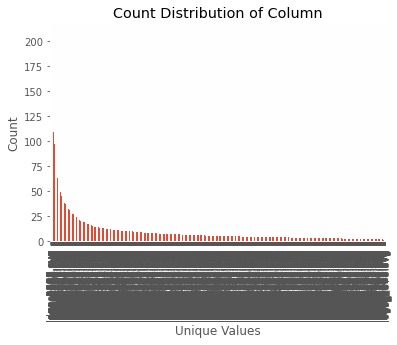

In [252]:
count_distribution = data['filename'].value_counts()
count_distribution.plot(kind='bar')
plt.xlabel('Unique Values')
plt.ylabel('Count')
plt.title('Count Distribution of Column')
plt.show()

In [6]:
# Read CSV into DataFrame
df = pd.read_csv('data/test_2/test_rating.csv')

#df.dropna(inplace=True)
df = df[['id','filename','data','rating']]
df = df.dropna()
df = df.reset_index(drop=True)

df['id'] = df.index

# separating to rating and animation
animation_df = df[['id','filename','data']]

rating_df = df[['id','filename','rating']]


In [7]:
animation_df

,id,filename,data
0,0,logo_0.svg,"0,0,0,1,0,0,0,0,0,0,0,0,2,-9,17,22,43,0,0,0,0,..."
1,1,logo_3555.svg,"4,0,1,0,0,0,0,0,0,0,0,1,1,20,-28,16,17,16.4101..."
2,2,logo_4597.svg,"70,0,0,0,0,0,0,0,0,0,1,0,2,-42,11,-36,4,0.0770..."
3,3,logo_975.svg,"5,0,0,1,0,0,0,0,0,0,0,3,2,34,42,12,-1,0,0,0,0,..."
4,4,logo_3578.svg,"2,0,0,0,0,0,0,0,1,0,0,0,5,2,-11,-16,-34,3.3476..."
...,...,...,...
3882,3882,logo_1411.svg,"1,0,0,1,0,0,0,0,0,0,0,0,1,23,35,22,30,13.63393..."
3883,3883,logo_970.svg,"0,0,0,0,0,0,0,0,0,0,1,0,4,45,34,-38,28,8.28508..."
3884,3884,logo_4944.svg,"0,0,0,0,1,0,0,0,0,0,0,0,3,-44,44,-13,-36,9.192..."
3885,3885,logo_149.svg,"6,0,0,1,0,0,0,0,0,0,0,0,1,-6,21,17,-45,0,0,0,0..."


In [8]:
animation_df['filename'].value_counts()

logo_1154.svg    6
logo_4228.svg    6
logo_2569.svg    5
logo_3242.svg    5
logo_1515.svg    5
                ..
logo_1185.svg    1
logo_3433.svg    1
logo_1982.svg    1
logo_1664.svg    1
logo_4692.svg    1
Name: filename, Length: 2690, dtype: int64

In [9]:
animation_df.isna().any()

id          False
filename    False
data        False
dtype: bool

In [10]:
rating_df

,id,filename,rating
0,0,logo_0.svg,4
1,1,logo_3555.svg,0
2,2,logo_4597.svg,0
3,3,logo_975.svg,0
4,4,logo_3578.svg,0
...,...,...,...
3882,3882,logo_1411.svg,0
3883,3883,logo_970.svg,0
3884,3884,logo_4944.svg,0
3885,3885,logo_149.svg,0


In [11]:
rating_df = rating_df[rating_df['filename'].isin(data['filename'])]
rating_df

,id,filename,rating
0,0,logo_0.svg,4
1,1,logo_3555.svg,0
2,2,logo_4597.svg,0
3,3,logo_975.svg,0
4,4,logo_3578.svg,0
...,...,...,...
3882,3882,logo_1411.svg,0
3883,3883,logo_970.svg,0
3884,3884,logo_4944.svg,0
3885,3885,logo_149.svg,0


In [12]:
# changing the structure of animation data 

# Split the 'data' column and explode
animation_df['data'] = animation_df['data'].str.rstrip(';').str.split(';')
animation_df = animation_df.explode('data')

# Reset the index
animation_df.reset_index(drop=True, inplace=True)

# separating the animation ids and animation params
animation_df[['animation_id','a_0','a_1','a_2','a_3','a_4','a_5','a_6','a_7','a_8','a_9',
           'a_10','a_11','a_12','a_13','a_14','a_15','a_16','a_17','a_18','a_19','a_20','a_21',
           'a_22','a_23','a_24','a_25']] = animation_df['data'].str.split(',', expand=True)

animation_df[['animation_id']] = animation_df[['animation_id']].astype(int)

animation_df[['a_0','a_1','a_2','a_3','a_4','a_5','a_6','a_7','a_8','a_9',
           'a_10','a_11','a_12','a_13','a_14','a_15','a_16','a_17','a_18','a_19','a_20','a_21',
           'a_22','a_23','a_24','a_25']] = animation_df[['a_0','a_1','a_2','a_3','a_4','a_5','a_6','a_7','a_8','a_9',
           'a_10','a_11','a_12','a_13','a_14','a_15','a_16','a_17','a_18','a_19','a_20','a_21',
           'a_22','a_23','a_24','a_25']].astype(float)

animation_df.drop(columns=['data'], inplace=True)

animation_df

/Users/namihosono/anaconda3/envs/animate_logos_v4/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,id,filename,animation_id,a_0,a_1,a_2,a_3,a_4,a_5,a_6,...,a_16,a_17,a_18,a_19,a_20,a_21,a_22,a_23,a_24,a_25
0,0,logo_0.svg,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0,logo_0.svg,3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
2,0,logo_0.svg,2,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,16.888462,18.0,29.0,45.0,99.0,9.0,185.0,7.297494,84.0,0.0
3,0,logo_0.svg,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,19.766639,220.0,-50.0,7.0,250.0,9.0,193.0,51.576758,96.0,0.0
4,1,logo_3555.svg,4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,16.410149,230.0,-29.0,25.0,219.0,159.0,94.0,88.374824,62.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77968,3886,logo_3066.svg,1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,6.439195,75.0,-34.0,-30.0,158.0,209.0,242.0,33.189940,68.0,0.0
77969,3886,logo_3066.svg,2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
77970,3886,logo_3066.svg,6,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
77971,3886,logo_3066.svg,2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


In [13]:
# combining the animation dataset and the embedded dataset

n_ids = animation_df['id'].nunique()

merged_df = pd.DataFrame()

i=0
for i in range(n_ids):


    # creating a temporary df to merge
    temp_animation = animation_df[animation_df['id']==i]

    if len(temp_animation) > 100: # selecting only sequence length less or equal to 300

        continue

    else:

        temp_animation.reset_index(drop=True, inplace=True)

        logo_name = temp_animation['filename'][0]

        temp_embedded = data[data['filename']==logo_name]
        temp_embedded.reset_index(drop=True, inplace=True)

        # changing the datatype to int
        temp_embedded['animation_id'] = temp_embedded['animation_id'].astype(int)

        temp_merged = pd.merge(temp_embedded, temp_animation, on=['filename', 'animation_id'], how='left')

        if len(temp_merged) > 100:

            continue

        else:
            # Fill NaN values with 0 for the animation parameter columns
            animation_param_cols = ['a_0','a_1','a_2','a_3','a_4','a_5','a_6','a_7','a_8','a_9',
                                    'a_10','a_11','a_12','a_13','a_14','a_15','a_16','a_17','a_18','a_19','a_20','a_21',
                                    'a_22','a_23','a_24','a_25']  
            temp_merged[animation_param_cols] = temp_merged[animation_param_cols].fillna(0)

            # reordering the columns
            imp_columns = ['id','filename','animation_id']
            new_columns_order = imp_columns + [col for col in temp_merged.columns if col not in imp_columns]
            temp_merged = temp_merged[new_columns_order]

            #setting the number of id
            temp_merged['id']= i

            merged_df = pd.concat([merged_df, temp_merged], ignore_index=True)


    i+=1

merged_df

/Users/namihosono/anaconda3/envs/animate_logos_v4/lib/python3.7/site-packages/ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/namihosono/anaconda3/envs/animate_logos_v4/lib/python3.7/site-packages/ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/namihosono/anaconda3/envs/animate_logos_v4/lib/python3.7/site-packages/ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_i

,id,filename,animation_id,0,1,2,3,4,5,6,...,a_16,a_17,a_18,a_19,a_20,a_21,a_22,a_23,a_24,a_25
0,0,logo_0.svg,0,-1.479738,1.499942,-0.460763,0.363093,-0.947988,-1.115443,1.581553,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
1,0,logo_0.svg,0,-1.479738,1.499942,-0.460763,0.363093,-0.947988,-1.115443,1.581553,...,19.766639,220.0,-50.0,7.0,250.0,9.0,193.0,51.576758,96.0,0.0
2,0,logo_0.svg,1,-0.652426,0.707069,1.247296,1.003180,-1.206389,0.562783,1.672614,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
3,0,logo_0.svg,2,-0.094627,1.475891,-0.203824,0.158015,-0.299620,0.895283,0.365908,...,16.888462,18.0,29.0,45.0,99.0,9.0,185.0,7.297494,84.0,0.0
4,4,logo_3578.svg,0,-1.479738,1.499942,-0.460763,0.363093,-0.947988,-1.115443,1.581553,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34527,3886,logo_3066.svg,3,1.057010,0.160823,1.422251,0.502830,-0.257403,-2.761421,-0.009759,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
34528,3886,logo_3066.svg,2,0.724264,-2.408592,1.234528,0.352898,0.359287,0.597046,-1.187603,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
34529,3886,logo_3066.svg,2,0.724264,-2.408592,1.234528,0.352898,0.359287,0.597046,-1.187603,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
34530,3886,logo_3066.svg,5,0.278795,-2.091899,0.640366,0.273481,0.597386,0.098415,-0.611767,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


In [14]:
merged_df['id'].value_counts()

1034    100
1841    100
3119     98
3555     95
3154     93
       ... 
2873      1
382       1
415       1
1210      1
1676      1
Name: id, Length: 3545, dtype: int64

In [15]:
merged_df.isna().any().any()

False

In [16]:
merged_df['filename'].value_counts()

logo_4056.svg    197
logo_1254.svg    186
logo_223.svg     183
logo_2545.svg    155
logo_4597.svg    155
                ... 
logo_4085.svg      1
logo_1188.svg      1
logo_1199.svg      1
logo_3938.svg      1
logo_3919.svg      1
Name: filename, Length: 2448, dtype: int64

In [17]:
if merged_df.isna().any().any():
    print("There are missing values in the DataFrame.")
else:
    print("No missing values in the DataFrame.")


No missing values in the DataFrame.


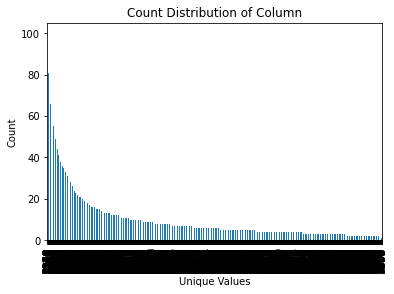

In [18]:
count_distribution = merged_df['id'].value_counts()
count_distribution.plot(kind='bar')
plt.xlabel('Unique Values')
plt.ylabel('Count')
plt.title('Count Distribution of Column')
plt.show()

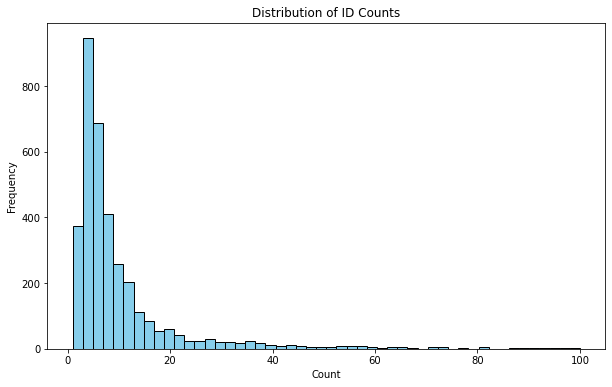

In [19]:
# Assuming merged_df['id'].value_counts() returns a Series
id_counts = merged_df['id'].value_counts()

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.hist(id_counts, bins=50, color='skyblue', edgecolor='black')
plt.title('Distribution of ID Counts')
plt.xlabel('Count')
plt.ylabel('Frequency')
plt.show()

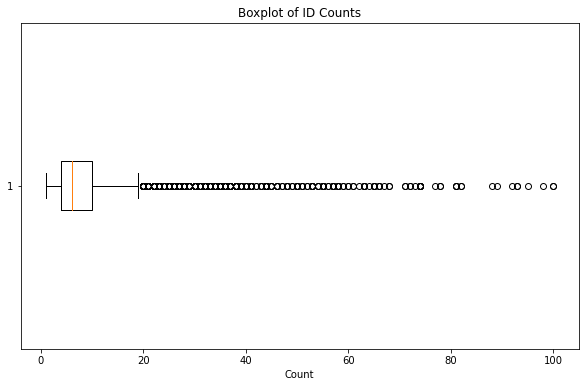

In [20]:
# Assuming merged_df['id'].value_counts() returns a Series
id_counts = merged_df['id'].value_counts()

# Plotting the boxplot
plt.figure(figsize=(10, 6))
plt.boxplot(id_counts, vert=False)
plt.title('Boxplot of ID Counts')
plt.xlabel('Count')
plt.show()

In [21]:
# creating a tensor 

# Filter relevant columns

columns_to_delete = ['filename','animation_id']
columns_to_include = [col for col in merged_df.columns if col not in columns_to_delete]
filtered_df = merged_df[columns_to_include]

# Group by id to create a sequence
grouped = filtered_df.groupby('id')

# Pad sequences
padded_sequences = []
max_sequence_length = grouped.size().max()
print(max_sequence_length)

for name, group in grouped:
    # Exclude the sequence column
    sequence = group.drop('id', axis=1).values  

    # Create a tensor filled with 500
    padded_sequence = torch.full((max_sequence_length, sequence.shape[1]), 500.0, dtype=torch.float64)  
    padded_sequence[:len(group)] = torch.tensor(sequence, dtype=torch.float64)
    padded_sequences.append(padded_sequence)

# Step 4: Convert sequences to a NumPy array
numpy_array = torch.stack(padded_sequences).numpy()

# Step 5: Create a PyTorch tensor
inp_tensor = torch.tensor(numpy_array, dtype=torch.float64)

# Display the resulting tensor
print(inp_tensor)


100
tensor([[[-1.4797e+00,  1.4999e+00, -4.6076e-01,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [-1.4797e+00,  1.4999e+00, -4.6076e-01,  ...,  5.1577e+01,
           9.6000e+01,  0.0000e+00],
         [-6.5243e-01,  7.0707e-01,  1.2473e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         ...,
         [ 5.0000e+02,  5.0000e+02,  5.0000e+02,  ...,  5.0000e+02,
           5.0000e+02,  5.0000e+02],
         [ 5.0000e+02,  5.0000e+02,  5.0000e+02,  ...,  5.0000e+02,
           5.0000e+02,  5.0000e+02],
         [ 5.0000e+02,  5.0000e+02,  5.0000e+02,  ...,  5.0000e+02,
           5.0000e+02,  5.0000e+02]],

        [[-1.4797e+00,  1.4999e+00, -4.6076e-01,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 1.1459e+00, -6.7892e-01,  6.4550e-01,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 4.4593e-01, -4.5464e-01,  8.6902e-02,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         ...,
         [ 5.0000e+02

In [22]:
inp_tensor.size()

torch.Size([3545, 100, 282])

In [23]:
torch.set_printoptions(precision=10)
inp_tensor

tensor([[[-1.4797376394e+00,  1.4999421835e+00, -4.6076336503e-01,
           ...,  0.0000000000e+00,  0.0000000000e+00,
           0.0000000000e+00],
         [-1.4797376394e+00,  1.4999421835e+00, -4.6076336503e-01,
           ...,  5.1576758011e+01,  9.6000000000e+01,
           0.0000000000e+00],
         [-6.5242552757e-01,  7.0706921816e-01,  1.2472964525e+00,
           ...,  0.0000000000e+00,  0.0000000000e+00,
           0.0000000000e+00],
         ...,
         [ 5.0000000000e+02,  5.0000000000e+02,  5.0000000000e+02,
           ...,  5.0000000000e+02,  5.0000000000e+02,
           5.0000000000e+02],
         [ 5.0000000000e+02,  5.0000000000e+02,  5.0000000000e+02,
           ...,  5.0000000000e+02,  5.0000000000e+02,
           5.0000000000e+02],
         [ 5.0000000000e+02,  5.0000000000e+02,  5.0000000000e+02,
           ...,  5.0000000000e+02,  5.0000000000e+02,
           5.0000000000e+02]],

        [[-1.4797376394e+00,  1.4999421835e+00, -4.6076336503e-01,
           

## Creating the target tensor

In [24]:
rating_df = rating_df[rating_df['id'].isin(merged_df['id'])]
rating_df

,id,filename,rating
0,0,logo_0.svg,4
4,4,logo_3578.svg,0
5,5,logo_1509.svg,3
6,6,logo_2309.svg,2
7,7,logo_2388.svg,2
...,...,...,...
3882,3882,logo_1411.svg,0
3883,3883,logo_970.svg,0
3884,3884,logo_4944.svg,0
3885,3885,logo_149.svg,0


array([[<AxesSubplot:title={'center':'rating'}>]], dtype=object)

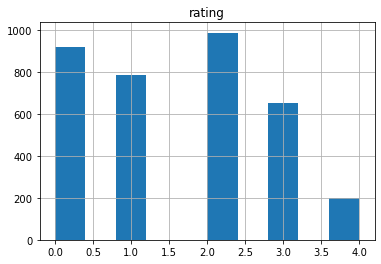

In [25]:
rating_df.hist(column='rating')

In [26]:
rating_df['rating'].value_counts()

2    988
0    922
1    785
3    651
4    199
Name: rating, dtype: int64

In [27]:
numpy_array = rating_df['rating'].to_numpy()

# Convert to PyTorch tensor
target_tensor = torch.tensor(numpy_array)

print(target_tensor)

tensor([4, 0, 3,  ..., 0, 0, 2])


In [28]:
target_tensor.size()

torch.Size([3545])

In [29]:
inp_tensor.size()[1]

100

In [30]:
# Desired shape

n_data = inp_tensor.size()[0]

desired_shape = (n_data, 1, 282)

# Pad the tensor with zeros
target_tensor = torch.nn.functional.pad(target_tensor.unsqueeze(1), (0, desired_shape[2] - 1))


target_tensor

tensor([[4, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [3, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [2, 0, 0,  ..., 0, 0, 0]])

In [31]:
target_tensor.size()

torch.Size([3545, 282])

In [32]:
target_tensor = target_tensor.unsqueeze(1) 
target_tensor

tensor([[[4, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0]],

        [[3, 0, 0,  ..., 0, 0, 0]],

        ...,

        [[0, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0]],

        [[2, 0, 0,  ..., 0, 0, 0]]])

In [33]:
target_tensor.size()

torch.Size([3545, 1, 282])

# Creating tensors with same distribution of classes

In [79]:
# Convert tensors to numpy arrays
inp_array = inp_tensor.numpy()
target_array = target_tensor.numpy()

# Reshape input array to 2D
inp_array_2d = inp_array.reshape(inp_array.shape[0], -1)

# Flatten target array properly
target_array_flat = target_array.reshape(target_array.shape[0], -1)

# Initialize StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.15, random_state=42)

# Split data into train and test sets while maintaining stratification
for train_val_index, test_index in sss.split(inp_array_2d, target_array_flat):
    # Split input and target tensors for train+val and test
    inp_train_val, inp_test = inp_tensor[train_val_index], inp_tensor[test_index]
    target_train_val, target_test = target_tensor[train_val_index], target_tensor[test_index]

# Convert tensors to numpy arrays
inp_train_val_array = inp_train_val.numpy()
target_train_val_array = target_train_val.numpy()

# Reshape input array to 2D
inp_train_val_array_2d = inp_train_val_array.reshape(inp_train_val_array.shape[0], -1)

# Flatten target array properly
target_train_val_array_flat = target_train_val_array.reshape(target_train_val_array.shape[0], -1)

for train_index, val_index in sss.split(inp_train_val_array_2d, target_train_val_array_flat):
    # Split input and target tensors
    inp_train, inp_val = inp_train_val[train_index], inp_train_val[val_index]
    target_train, target_val = target_train_val[train_index], target_train_val[val_index]


In [107]:
# save the tensors as txt

# Save training data
torch.save(inp_train, 'inp_train.txt')
torch.save(target_train, 'target_train.txt')

# Save validation data
torch.save(inp_val, 'inp_val.txt')
torch.save(target_val, 'target_val.txt')

# Save test data
torch.save(inp_test, 'inp_test.txt')
torch.save(target_test, 'target_test.txt')

In [3]:
# load the tensors from txt files

# Load training data
inp_train = torch.tensor(torch.load('inp_train.txt'))
target_train = torch.tensor(torch.load('target_train.txt'))

# Load validation data
inp_val = torch.tensor(torch.load('inp_val.txt'))
target_val = torch.tensor(torch.load('target_val.txt'))

# Load test data
inp_test = torch.tensor(torch.load('inp_test.txt'))
target_test = torch.tensor(torch.load('target_test.txt'))


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/var/folders/lc/x80d0s4s4gb_bd5zxw715wnc0000gn/T/ipykernel_58445/2176470016.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inp_train = torch.tensor(torch.load('inp_train.txt'))
/var/folders/lc/x80d0s4s4gb_bd5zxw715wnc0000gn/T/ipykernel_58445/2176470016.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target_train = torch.tensor(torch.load('target_train.txt'))
/var/folders/lc/x80d0s4s4gb_bd5zxw715wnc0000gn/T/ipykernel_58445/2176470016.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inp_val = torch.tensor(torch.load('inp_val.txt

In [4]:
target_train.size()

torch.Size([2561, 1, 282])

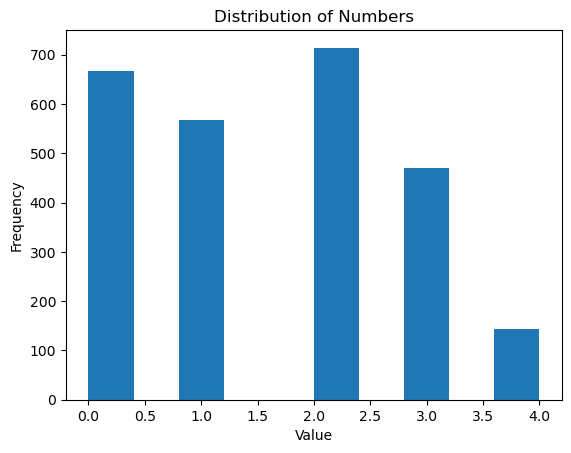

In [6]:
target_train_array = target_train.numpy()
train_rate = target_train_array[:, :, 0].flatten()  # Extract the numbers and flatten the array
# Plot the histogram
plt.hist(train_rate)  # Adjust the number of bins as needed
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Numbers')
plt.show()

In [8]:
# Calculate the frequency of each unique number
train_numbers, counts = np.unique(train_rate, return_counts=True)

# Calculate the percentage of occurrence of each number
percentages = counts / len(train_rate) * 100

# Display the percentages
for num, percent in zip(train_numbers, percentages):
    print(f'Number {num}: {percent:.2f}%')

Number 0: 26.01%
Number 1: 22.14%
Number 2: 27.88%
Number 3: 18.35%
Number 4: 5.62%


In [9]:
target_val.size()

torch.Size([452, 1, 282])

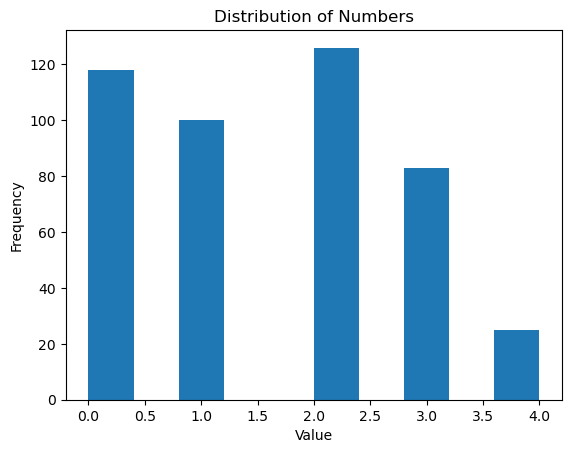

In [10]:
target_val_array = target_val.numpy()
val_rate = target_val_array[:, :, 0].flatten()  # Extract the numbers and flatten the array
# Plot the histogram
plt.hist(val_rate)  # Adjust the number of bins as needed
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Numbers')
plt.show()

In [11]:
# Calculate the frequency of each unique number
val_numbers, counts = np.unique(val_rate, return_counts=True)

# Calculate the percentage of occurrence of each number
percentages = counts / len(val_rate) * 100

# Display the percentages
for num, percent in zip(val_numbers, percentages):
    print(f'Number {num}: {percent:.2f}%')

Number 0: 26.11%
Number 1: 22.12%
Number 2: 27.88%
Number 3: 18.36%
Number 4: 5.53%


In [12]:
target_test.size()

torch.Size([532, 1, 282])

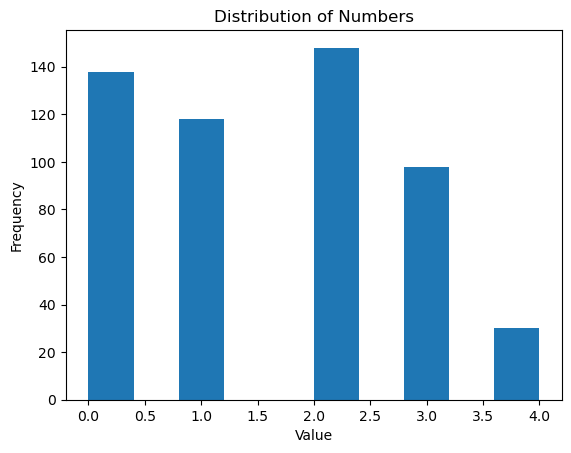

In [13]:
target_test_array = target_test.numpy()
test_rate = target_test_array[:, :, 0].flatten()  # Extract the numbers and flatten the array
# Plot the histogram
plt.hist(test_rate)  # Adjust the number of bins as needed
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Distribution of Numbers')
plt.show()

In [14]:
# Calculate the frequency of each unique number
test_numbers, counts = np.unique(test_rate, return_counts=True)

# Calculate the percentage of occurrence of each number
percentages = counts / len(test_rate) * 100

# Display the percentages
for num, percent in zip(test_numbers, percentages):
    print(f'Number {num}: {percent:.2f}%')

Number 0: 25.94%
Number 1: 22.18%
Number 2: 27.82%
Number 3: 18.42%
Number 4: 5.64%


In [15]:
inp_test.size()

torch.Size([532, 100, 282])

In [16]:
inp_train.size()

torch.Size([2561, 100, 282])

In [17]:
inp_val.size()

torch.Size([452, 100, 282])

## Transformer

In [19]:
torch.__version__
torch.cuda.is_available()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = "cpu"
print(device)

cpu


In [20]:
class PositionalEncoding(nn.Module):
    def __init__(self, dim_model, dropout_p, max_len):
        super().__init__()
        # Modified version from: https://pytorch.org/tutorials/beginner/transformer_tutorial.html
        # max_len determines how far the position can have an effect on a token (window)
        
        # Info
        self.dropout = nn.Dropout(dropout_p)
        
        # Encoding - From formula
        pos_encoding = torch.zeros(max_len, dim_model)
        positions_list = torch.arange(0, max_len, dtype=torch.float).view(-1, 1) # 0, 1, 2, 3, 4, 5
        division_term = torch.exp(torch.arange(0, dim_model, 2).float() * (-math.log(10000.0)) / dim_model) # 1000^(2i/dim_model)
        
        # PE(pos, 2i) = sin(pos/1000^(2i/dim_model))
        pos_encoding[:, 0::2] = torch.sin(positions_list * division_term)
        
        # PE(pos, 2i + 1) = cos(pos/1000^(2i/dim_model))
        pos_encoding[:, 1::2] = torch.cos(positions_list * division_term)
        
        # Saving buffer (same as parameter without gradients needed)
        pos_encoding = pos_encoding.unsqueeze(0).transpose(0, 1)
        self.register_buffer("pos_encoding",pos_encoding)
        
    def forward(self, token_embedding: torch.tensor) -> torch.tensor:
        # Residual connection + pos encoding
        return self.dropout(token_embedding + self.pos_encoding[:token_embedding.size(0), :])

In [21]:
class Transformer(nn.Module):
    """
    Model from "A detailed guide to Pytorch's nn.Transformer() module.", by
    Daniel Melchor: https://medium.com/@danielmelchor/a-detailed-guide-to-pytorchs-nn-transformer-module-c80afbc9ffb1
    """
    # Constructor
    def __init__(
        self,
        num_tokens,
        dim_model,
        num_heads,
        num_encoder_layers,
        num_decoder_layers,
        dropout_p,
    ):
        super().__init__()

        # INFO
        self.model_type = "Transformer"
        self.dim_model = dim_model

        # for get_params
        self.num_tokens = num_tokens
        self.num_heads = num_heads
        self.num_encoder_layers = num_encoder_layers
        self.num_decoder_layers = num_decoder_layers
        self.dropout_p = dropout_p

        # LAYERS
        self.positional_encoder = PositionalEncoding(
            dim_model=dim_model, dropout_p=dropout_p, max_len=200
        )
        self.embedding = nn.Embedding(num_tokens, dim_model)
        self.transformer = nn.Transformer(
            d_model=dim_model,
            nhead=num_heads,
            num_encoder_layers=num_encoder_layers,
            num_decoder_layers=num_decoder_layers,
            dropout=dropout_p,
            batch_first=True
        )
        self.out = nn.Linear(dim_model, num_tokens)
        
    def forward(self, src, tgt, tgt_mask=None, src_pad_mask=None, tgt_pad_mask=None, batch_first=True):
        # Src size must be (batch_size, src sequence length)
        # Tgt size must be (batch_size, tgt sequence length)

        # Embedding + positional encoding - Out size = (batch_size, sequence length, dim_model)
        #src = self.embedding(src) * math.sqrt(self.dim_model)
            #tgt = self.embedding(tgt) * math.sqrt(self.dim_model)
        src = self.positional_encoder(src)
        tgt = self.positional_encoder(tgt)
        
        # Transformer blocks - Out size = (sequence length, batch_size, num_tokens)
        #print(src.shape, tgt.shape)
        #transformer_out = self.transformer(src, tgt, tgt_mask=tgt_mask, src_key_padding_mask=src_pad_mask, tgt_key_padding_mask=tgt_pad_mask)
        transformer_out = self.transformer(src, tgt, src_key_padding_mask=src_pad_mask)
        
        out = self.out(transformer_out)
        
        return out
      
    def get_tgt_mask(self, size) -> torch.tensor:
        # Generates a squeare matrix where the each row allows one word more to be seen
        mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
        mask = mask.float()
        mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
        mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0
        
        # EX for size=5:
        # [[0., -inf, -inf, -inf, -inf],
        #  [0.,   0., -inf, -inf, -inf],
        #  [0.,   0.,   0., -inf, -inf],
        #  [0.,   0.,   0.,   0., -inf],
        #  [0.,   0.,   0.,   0.,   0.]]
        
        return mask
    def create_pad_mask(self, matrix: torch.tensor, pad_token: int) -> torch.tensor:
        # If matrix = [1,2,3,0,0,0] where pad_token=0, the result mask is
        # [False, False, False, True, True, True]
        mask = []
        pad_token = 500
        #print(matrix)
        for i in range(0, matrix.size(0)):
            seq = []
            for j in range(0, matrix.size(1)):
                if matrix[i,j,0] == pad_token:
                    seq.append(True)
                else:
                    seq.append(False)
            mask.append(seq)
        result = torch.tensor(mask)
        #print(matrix, result, result.shape)
        return result

In [22]:
class CustomLoss(nn.Module):
    def __init__(self):
        super(CustomLoss, self).__init__()

    def forward(self, inputs, targets):
        #typeLoss = nn.CrossEntropyLoss()
        ParameterLoss = nn.MSELoss()

        #loss = 0.5 * typeLoss(inputs[:,:,:6], targets[:,:,:6]) + 0.5 * ParameterLoss(inputs[:,:,6:12], targets[:,:,6:12])
        #print(inputs[:,:,:6], inputs[:,:,:6].shape, targets[:,:,6:12], targets[:,:,6:12].shape)

        loss = ParameterLoss(inputs[:,:,:1], targets[:,:,:1])

        return loss

In [23]:
def train_loop(model, opt, loss_fn, dataloader):
    """
    Method from "A detailed guide to Pytorch's nn.Transformer() module.", by
    Daniel Melchor: https://medium.com/@danielmelchor/a-detailed-guide-to-pytorchs-nn-transformer-module-c80afbc9ffb1
    """
    
    model.train()
    total_loss = 0
    
    for batch in dataloader:
        X, y = batch[0], batch[1]
        X, y = torch.tensor(X).to(device), torch.tensor(y).to(device)

        opt.zero_grad()
        
        #tgt_mask = model.get_tgt_mask(sequence_length).to(device)
        pad_mask_src = model.create_pad_mask(X, 500).to(device)
        #pad_mask_tgt = model.create_pad_mask(y, 10).to(device)

        # Standard training except we pass in y_input and tgt_mask
        #print(X.shape, y.shape)
        pred = model(X, y, src_pad_mask=pad_mask_src)

        #print('Predictions: ',pred[:,:,:1])

        # Permute pred to have batch size first again
        #pred = pred.permute(1, 2, 0)      
        loss = loss_fn(pred, y)

        loss.backward()
        opt.step()
    
        total_loss += loss.detach().item()
        
    return total_loss / len(dataloader)

In [24]:
def validation_loop(model, loss_fn, dataloader):
    """
    Method from "A detailed guide to Pytorch's nn.Transformer() module.", by
    Daniel Melchor: https://medium.com/@danielmelchor/a-detailed-guide-to-pytorchs-nn-transformer-module-c80afbc9ffb1
    """
    
    model.eval()
    total_loss = 0
    
    with torch.no_grad():
        for batch in dataloader:
            X, y = batch[0], batch[1]
            X, y = torch.tensor(X, device=device), torch.tensor(y, device=device)

            #tgt_mask = model.get_tgt_mask(sequence_length).to(device)
            pad_mask_src = model.create_pad_mask(X, 500).to(device)
            #pad_mask_tgt = model.create_pad_mask(y, 10).to(device)

            # Standard training except we pass in y_input and src_mask
            #print("val ", X.shape, y.shape, X.dtype, y.dtype)
            #pred = model(X, y, tgt_mask, src_pad_mask=pad_mask_src, tgt_pad_mask=pad_mask_tgt)
            pred = model(X, y, src_pad_mask=pad_mask_src)


            # Permute pred to have batch size first again
            #pred = pred.permute(1, 2, 0)      
            loss = loss_fn(pred, y)
            total_loss += loss.detach().item()
        
    return total_loss / len(dataloader)

In [25]:
def validation_loop2(model, loss_fn, train_dataloader, val_dataloader):
    """
    Method from "A detailed guide to Pytorch's nn.Transformer() module.", by
    Daniel Melchor: https://medium.com/@danielmelchor/a-detailed-guide-to-pytorchs-nn-transformer-module-c80afbc9ffb1
    """
    
    model.eval()
    train_total_loss = 0
    val_total_loss = 0
    
    with torch.no_grad():
        for batch in val_dataloader:
            X, y = batch[0], batch[1]
            X, y = torch.tensor(X, device=device), torch.tensor(y, device=device)

            pad_mask_src = model.create_pad_mask(X, 500).to(device)

            # Standard training except we pass in y_input and src_mask
            #print("val ", X.shape, y.shape, X.dtype, y.dtype)
            pred = model(X, y, src_pad_mask=pad_mask_src)
      
            loss = loss_fn(pred, y)
            val_total_loss += loss.detach().item()
        
        for batch in train_dataloader:
            X, y = batch[0], batch[1]
            X, y = torch.tensor(X, device=device), torch.tensor(y, device=device)

            pad_mask_src = model.create_pad_mask(X, 500).to(device)

            # Standard training except we pass in y_input and src_mask
            #print("val ", X.shape, y.shape, X.dtype, y.dtype)
            pred = model(X, y, src_pad_mask=pad_mask_src)

      
            loss = loss_fn(pred, y)
            train_total_loss += loss.detach().item()
        
    return train_total_loss / len(train_dataloader), val_total_loss / len(val_dataloader)

In [26]:
model = Transformer(
    num_tokens=inp_train.size()[1], dim_model=282, num_heads=6, num_encoder_layers=8, num_decoder_layers=8, dropout_p=0.1
).to(device)
opt = torch.optim.SGD(model.parameters(), lr=0.001)
loss_fn = CustomLoss()

# num_tokens = length of sequence

In [28]:
# Create DataLoader for training set
train_dataloader = DataLoader(TensorDataset(inp_train.float(), target_train.float()), batch_size=30, shuffle=True, drop_last=True)

# Create DataLoader for validation set
val_dataloader = DataLoader(TensorDataset(inp_val.float(), target_val.float()), batch_size=30, shuffle=True, drop_last=True)

In [346]:
# Split the data into training and validation sets
#inp_train, inp_val, target_train, target_val = train_test_split(inp_tensor, target_tensor, test_size=0.2, random_state=42)

# Create DataLoader for training set
train_dataloader = DataLoader(TensorDataset(inp_train.float(), target_train.float()), batch_size=30, shuffle=True, drop_last=True)

# Create DataLoader for validation set
val_dataloader = DataLoader(TensorDataset(inp_val.float(), target_val.float()), batch_size=30, shuffle=True, drop_last=True)

n_epochs = 40


#train_dataloader = DataLoader(TensorDataset(inp_tensor.float(), target_tensor.float()), batch_size=53, shuffle=True, drop_last=True)
#val_dataloader = DataLoader(TensorDataset(inp_tensor.float(), target_tensor.float()),batch_size=53, shuffle=True,  drop_last=True)

def fit(model, opt, loss_fn, train_dataloader, val_dataloader, epochs):
    """
    Method from "A detailed guide to Pytorch's nn.Transformer() module.", by
    Daniel Melchor: https://medium.com/@danielmelchor/a-detailed-guide-to-pytorchs-nn-transformer-module-c80afbc9ffb1
    """
    
    # Used for plotting later on
    train_loss_list, validation_loss_list = [], []
    
    print("Training and validating model")
    for epoch in range(epochs):
        print("-"*25, f"Epoch {epoch + 1}","-"*25)
        
        train_loss = train_loop(model, opt, loss_fn, train_dataloader)
        train_loss_list += [train_loss]
        
        validation_loss = validation_loop(model, loss_fn, val_dataloader)
        validation_loss_list += [validation_loss]
        
        print(f"Training loss: {train_loss:.4f}")
        print(f"Validation loss: {validation_loss:.4f}")
        print()
        
    return train_loss_list, validation_loss_list
    
train_loss_list, validation_loss_list = fit(model, opt, loss_fn, train_dataloader, val_dataloader, n_epochs)

Training and validating model
------------------------- Epoch 1 -------------------------
Training loss: 1.5993
Validation loss: 1.2503

------------------------- Epoch 2 -------------------------
Training loss: 1.3505
Validation loss: 0.7522

------------------------- Epoch 3 -------------------------
Training loss: 1.0048
Validation loss: 0.5386

------------------------- Epoch 4 -------------------------
Training loss: 0.7398
Validation loss: 0.7343

------------------------- Epoch 5 -------------------------
Training loss: 0.7309
Validation loss: 0.2674

------------------------- Epoch 6 -------------------------
Training loss: 0.6286
Validation loss: 0.2395

------------------------- Epoch 7 -------------------------
Training loss: 0.5841
Validation loss: 0.2621

------------------------- Epoch 8 -------------------------
Training loss: 0.5326
Validation loss: 0.2501

------------------------- Epoch 9 -------------------------
Training loss: 0.5554
Validation loss: 0.2687

-------

: 

In [33]:
train_dataloader = DataLoader(TensorDataset(inp_train.float(), target_train.float()), batch_size=30, shuffle=True, drop_last=True)

# Create DataLoader for validation set
val_dataloader = DataLoader(TensorDataset(inp_val.float(), target_val.float()), batch_size=30, shuffle=True, drop_last=True)

In [66]:
# Create DataLoader for training set
train_dataloader = DataLoader(TensorDataset(inp_train.float(), target_train.float()), batch_size=30, shuffle=True, drop_last=True)

# Create DataLoader for validation set
val_dataloader = DataLoader(TensorDataset(inp_val.float(), target_val.float()), batch_size=30, shuffle=True, drop_last=True)

n_epochs = 10


#train_dataloader = DataLoader(TensorDataset(inp_tensor.float(), target_tensor.float()), batch_size=53, shuffle=True, drop_last=True)
#val_dataloader = DataLoader(TensorDataset(inp_tensor.float(), target_tensor.float()),batch_size=53, shuffle=True,  drop_last=True)

def fit(model, opt, loss_fn, train_dataloader, val_dataloader, epochs):
    """
    Method from "A detailed guide to Pytorch's nn.Transformer() module.", by
    Daniel Melchor: https://medium.com/@danielmelchor/a-detailed-guide-to-pytorchs-nn-transformer-module-c80afbc9ffb1
    """
    
    # Used for plotting later on
    train_loss_list, validation_loss_list,train_v_loss_list  = [], [], []
    
    print("Training and validating model")
    for epoch in range(epochs):
        print("-"*25, f"Epoch {epoch + 1}","-"*25)
        
        train_loss = train_loop(model, opt, loss_fn, train_dataloader)
        train_loss_list += [train_loss]
        
        train_v_loss, validation_loss = validation_loop2(model, loss_fn, train_dataloader,val_dataloader)
        train_v_loss_list += [train_v_loss]
        validation_loss_list += [validation_loss]
        
        print(f"Training loss: {train_loss:.4f}")
        print(f"Training loss: {train_v_loss:.4f}")
        print(f"Validation loss: {validation_loss:.4f}")
        print()
        
    return train_loss_list, train_v_loss_list, validation_loss_list
    
train_loss_list,train_v_loss_list, validation_loss_list = fit(model, opt, loss_fn, train_dataloader, val_dataloader, n_epochs)

Training and validating model
------------------------- Epoch 1 -------------------------


/Users/namihosono/anaconda3/envs/animate_logos_v4/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/Users/namihosono/anaconda3/envs/animate_logos_v4/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
/Users/namihosono/anaconda3/envs/animate_logos_v4/lib/python3.7/site-packages/ipykernel_launcher.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Training loss: 1.5869
Training loss: 1.5541
Validation loss: 1.5482

------------------------- Epoch 2 -------------------------
Training loss: 1.3888
Training loss: 0.9801
Validation loss: 0.9879

------------------------- Epoch 3 -------------------------
Training loss: 1.1648
Training loss: 0.4420
Validation loss: 0.4724

------------------------- Epoch 4 -------------------------
Training loss: 0.9198
Training loss: 0.3348
Validation loss: 0.3631

------------------------- Epoch 5 -------------------------
Training loss: 0.6784
Training loss: 0.3121
Validation loss: 0.3138

------------------------- Epoch 6 -------------------------
Training loss: 0.6975
Training loss: 0.2603
Validation loss: 0.2768

------------------------- Epoch 7 -------------------------
Training loss: 0.6286
Training loss: 0.2904
Validation loss: 0.3020

------------------------- Epoch 8 -------------------------
Training loss: 0.5765
Training loss: 0.2638
Validation loss: 0.2752

------------------------- Ep

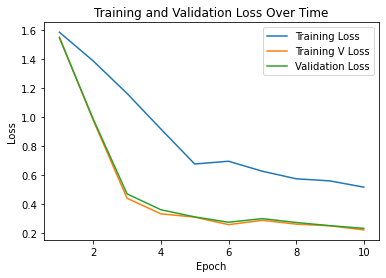

In [67]:
# Plot the training and validation loss
plt.plot(range(1, n_epochs + 1), train_loss_list, label='Training Loss')
plt.plot(range(1, n_epochs + 1), train_v_loss_list, label='Training V Loss')
plt.plot(range(1, n_epochs + 1), validation_loss_list, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Time')
plt.legend()
plt.show()

------------------------- Epoch 1 -------------------------

Training loss: 1.9472

Validation loss: 2.6898

------------------------- Epoch 2 -------------------------

Training loss: 1.7453

Validation loss: 1.4949

------------------------- Epoch 3 -------------------------

Training loss: 1.6213

Validation loss: 1.6651

------------------------- Epoch 4 -------------------------

Training loss: 1.4801

Validation loss: 1.0071

------------------------- Epoch 5 -------------------------

Training loss: 1.3123

Validation loss: 0.5629

------------------------- Epoch 6 -------------------------

Training loss: 1.0377

Validation loss: 0.5361

------------------------- Epoch 7 -------------------------

Training loss: 0.9008

Validation loss: 0.4411

------------------------- Epoch 8 -------------------------

Training loss: 0.8654

Validation loss: 0.4542

------------------------- Epoch 9 -------------------------

Training loss: 0.7411

Validation loss: 0.4014

------------------------- Epoch 10 -------------------------

Training loss: 0.7390

Validation loss: 0.3069

------------------------- Epoch 11 -------------------------

In [302]:
# save the model parameters (state_dict)
torch.save(model.state_dict(), 'reward_function_mode_state_dict_5.pth')

## When using the model
# If you saved only the state_dict, you need to create an instance of your model first:
#loaded_model = YourTransformerModelClass()
#loaded_model.load_state_dict(torch.load('transformer_model_state_dict.pth'))

## Hyperparameter tuning

In [36]:
from transformer_for_reward_function import Transformer, CustomLoss
import optuna
from torch.utils.data import DataLoader

MAX_EPOCHS = 15
loss_function = CustomLoss()

def objective(trial):
    # Define the hyperparameter search space
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True)
    num_encoder_layers = trial.suggest_categorical('num_encoder_layers', [2, 4, 6, 8])
    num_decoder_layers = trial.suggest_categorical('num_decoder_layers', [4, 6, 8,10])
    # batch_size = trial.suggest_categorical('batch_size', [64])
    num_heads = trial.suggest_categorical('num_heads', [2,3,6,47])
    dropout = trial.suggest_float('dropout', 0.1, 0.3)
    #use_positional_encoder = trial.suggest_categorical('pos_encoder_max_len', [True, False])
    
    print(f'Parameters selected')
    #print(f'num_encoder_layers; num_decoder_layers; learning_rate; num_heads; use_positional_encoder; dropout')
    print(f'num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout')
    #print(f'{num_encoder_layers}; {num_decoder_layers}; {learning_rate}; {num_heads}; {use_positional_encoder}; {dropout}'.replace('.', ','))
    print(f'{num_encoder_layers}; {num_decoder_layers}; {learning_rate}; {num_heads}; {dropout}'.replace('.', ','))
    
    # Instantiate the model with suggested hyperparameters
    model = Transformer(
        dim_model=282,
        num_heads=num_heads,
        num_encoder_layers=num_encoder_layers,
        num_decoder_layers=num_decoder_layers,
        dropout_p=dropout,
        num_tokens= inp_train.size()[1],
        #use_positional_encoder=use_positional_encoder
    ).to(device)
        
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    train_loss_list, validation_loss_list = [], []

    validation_loss = -1
    # Training loop with early stopping, validation, etc.
    for epoch in range(MAX_EPOCHS):
        print(f' =========== EPOCH {epoch} ===========')
        
        train_loss = train_loop(model, optimizer, loss_function, train_dataloader)
        train_loss_list += [train_loss]

        validation_loss = validation_loop(model, loss_function, val_dataloader)
        validation_loss_list += [validation_loss]
        
        print(f'Train Loss: {train_loss:.4f}, Validation Loss: {validation_loss:.4f}')
        
        # Report the validation loss to Optuna
        trial.report(validation_loss, epoch)
        
        # Implement early stopping logic
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()
    
    print(f'Best validation loss: {validation_loss}')
    #print(f'num_encoder_layers; num_decoder_layers; learning_rate; num_heads; use_positional_encoder; dropout;')
    print(f'num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;')
    #print(f'{num_encoder_layers}; {num_decoder_layers}; {learning_rate:.8f}; {num_heads}; {use_positional_encoder}; {dropout:.8f}; Validation; '.replace('.', ','),
          #"; ".join([str(f"{loss:.4f}").replace('.', ',') for loss in validation_loss_list]))
    
    print(f'{num_encoder_layers}; {num_decoder_layers}; {learning_rate:.8f}; {num_heads}; {dropout:.8f}; Validation; '.replace('.', ','),
          "; ".join([str(f"{loss:.4f}").replace('.', ',') for loss in validation_loss_list]))
    print(f' ; ; ; ; ; Train; ',
          "; ".join([str(f"{loss:.4f}").replace('.', ',') for loss in train_loss_list]))
    
    return validation_loss

In [37]:
my_study = optuna.create_study(
    direction='minimize',
    study_name='for_reward_2', # IMPORTANT: Chance Name when new Dataset
    storage='sqlite:///animate_svg_optuna.db',
    load_if_exists=True
)

[I 2024-03-16 03:31:08,298] Using an existing study with name 'for_reward_2' instead of creating a new one.


In [38]:
my_study.optimize(objective, n_trials=75)

Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,002288667780396612; 2; 0,21858335708969742
 =========== EPOCH 0 ===========


/var/folders/lc/x80d0s4s4gb_bd5zxw715wnc0000gn/T/ipykernel_58445/1278129555.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X, y = torch.tensor(X).to(device), torch.tensor(y).to(device)
/var/folders/lc/x80d0s4s4gb_bd5zxw715wnc0000gn/T/ipykernel_58445/177667497.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X, y = torch.tensor(X, device=device), torch.tensor(y, device=device)
/Users/namihosono/anaconda3/envs/animate_svg/lib/python3.12/site-packages/torch/nn/modules/transformer.py:384: UserWarning: The PyTorch API of nested tensors is in prototype stage and will change in the near future. (Triggered internally at /Users/runner/work/_temp/anaconda/conda-bld/pytorch_1708025538153/

Train Loss: 2.1009, Validation Loss: 1.4836
 =========== EPOCH 1 ===========
Train Loss: 1.5065, Validation Loss: 1.7907
 =========== EPOCH 2 ===========
Train Loss: 1.4999, Validation Loss: 1.4756
 =========== EPOCH 3 ===========
Train Loss: 1.5020, Validation Loss: 1.4881
 =========== EPOCH 4 ===========
Train Loss: 1.5133, Validation Loss: 1.5698
 =========== EPOCH 5 ===========
Train Loss: 1.5240, Validation Loss: 1.5843
 =========== EPOCH 6 ===========
Train Loss: 1.5047, Validation Loss: 1.4954
 =========== EPOCH 7 ===========
Train Loss: 1.5187, Validation Loss: 1.6257
 =========== EPOCH 8 ===========
Train Loss: 1.5108, Validation Loss: 1.5026
 =========== EPOCH 9 ===========
Train Loss: 1.4910, Validation Loss: 1.7154
 =========== EPOCH 10 ===========
Train Loss: 1.4923, Validation Loss: 1.5375
 =========== EPOCH 11 ===========
Train Loss: 1.4990, Validation Loss: 1.6092
 =========== EPOCH 12 ===========
Train Loss: 1.5011, Validation Loss: 1.5315
 =========== EPOCH 13 =======

[I 2024-03-16 04:39:50,586] Trial 1 finished with value: 1.5670561949412027 and parameters: {'learning_rate': 0.002288667780396612, 'num_encoder_layers': 4, 'num_decoder_layers': 4, 'num_heads': 2, 'dropout': 0.21858335708969742}. Best is trial 1 with value: 1.5670561949412027.


Train Loss: 1.4981, Validation Loss: 1.5671
Best validation loss: 1.5670561949412027
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
4; 4; 0,00228867; 2; 0,21858336; Validation;  1,4836; 1,7907; 1,4756; 1,4881; 1,5698; 1,5843; 1,4954; 1,6257; 1,5026; 1,7154; 1,5375; 1,6092; 1,5315; 1,8507; 1,5671
 ; ; ; ; ; Train;  2,1009; 1,5065; 1,4999; 1,5020; 1,5133; 1,5240; 1,5047; 1,5187; 1,5108; 1,4910; 1,4923; 1,4990; 1,5011; 1,4937; 1,4981
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
8; 6; 0,00011115436187847079; 2; 0,20087835658319328
 =========== EPOCH 0 ===========
Train Loss: 1.7336, Validation Loss: 1.4644
 =========== EPOCH 1 ===========
Train Loss: 1.3206, Validation Loss: 3.0373
 =========== EPOCH 2 ===========
Train Loss: 0.8795, Validation Loss: 3.0570
 =========== EPOCH 3 ===========
Train Loss: 0.7859, Validation Loss: 2.5917
 =========== EPOCH 4 ===========
Train Loss: 0.6877, Validation Loss: 2.9942
 ====

[I 2024-03-16 06:53:53,823] Trial 2 finished with value: 1.5078457792599995 and parameters: {'learning_rate': 0.00011115436187847079, 'num_encoder_layers': 8, 'num_decoder_layers': 6, 'num_heads': 2, 'dropout': 0.20087835658319328}. Best is trial 2 with value: 1.5078457792599995.


Train Loss: 0.6257, Validation Loss: 1.5078
Best validation loss: 1.5078457792599995
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
8; 6; 0,00011115; 2; 0,20087836; Validation;  1,4644; 3,0373; 3,0570; 2,5917; 2,9942; 2,0327; 1,5772; 2,0324; 1,8539; 1,9196; 1,6221; 1,3797; 1,2573; 1,1587; 1,5078
 ; ; ; ; ; Train;  1,7336; 1,3206; 0,8795; 0,7859; 0,6877; 0,6366; 0,6499; 0,6564; 0,6155; 0,5978; 0,5830; 0,5773; 0,5685; 0,5317; 0,6257
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
6; 4; 0,008536414971113368; 3; 0,18360431540483468
 =========== EPOCH 0 ===========


/Users/namihosono/anaconda3/envs/animate_svg/lib/python3.12/site-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.num_heads is odd
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Train Loss: 2.5121, Validation Loss: 1.5171
 =========== EPOCH 1 ===========
Train Loss: 1.5326, Validation Loss: 1.7530
 =========== EPOCH 2 ===========
Train Loss: 1.5065, Validation Loss: 1.4845
 =========== EPOCH 3 ===========
Train Loss: 1.5753, Validation Loss: 1.4726
 =========== EPOCH 4 ===========
Train Loss: 1.5631, Validation Loss: 1.4788
 =========== EPOCH 5 ===========
Train Loss: 1.5011, Validation Loss: 1.7844
 =========== EPOCH 6 ===========
Train Loss: 1.5238, Validation Loss: 1.4618
 =========== EPOCH 7 ===========
Train Loss: 1.5012, Validation Loss: 1.4698
 =========== EPOCH 8 ===========
Train Loss: 1.5157, Validation Loss: 1.5365
 =========== EPOCH 9 ===========
Train Loss: 1.5111, Validation Loss: 1.5182
 =========== EPOCH 10 ===========
Train Loss: 1.4999, Validation Loss: 1.4876
 =========== EPOCH 11 ===========
Train Loss: 1.5102, Validation Loss: 1.5477
 =========== EPOCH 12 ===========
Train Loss: 1.5033, Validation Loss: 1.6521
 =========== EPOCH 13 =======

[I 2024-03-16 08:37:24,578] Trial 3 finished with value: 1.4691685040791829 and parameters: {'learning_rate': 0.008536414971113368, 'num_encoder_layers': 6, 'num_decoder_layers': 4, 'num_heads': 3, 'dropout': 0.18360431540483468}. Best is trial 3 with value: 1.4691685040791829.


Train Loss: 1.5100, Validation Loss: 1.4692
Best validation loss: 1.4691685040791829
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
6; 4; 0,00853641; 3; 0,18360432; Validation;  1,5171; 1,7530; 1,4845; 1,4726; 1,4788; 1,7844; 1,4618; 1,4698; 1,5365; 1,5182; 1,4876; 1,5477; 1,6521; 1,4779; 1,4692
 ; ; ; ; ; Train;  2,5121; 1,5326; 1,5065; 1,5753; 1,5631; 1,5011; 1,5238; 1,5012; 1,5157; 1,5111; 1,4999; 1,5102; 1,5033; 1,4986; 1,5100
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 10; 0,0001036090993741653; 3; 0,16676539481235825
 =========== EPOCH 0 ===========
Train Loss: 1.6933, Validation Loss: 1.4541
 =========== EPOCH 1 ===========
Train Loss: 1.4461, Validation Loss: 1.4564
 =========== EPOCH 2 ===========
Train Loss: 1.2911, Validation Loss: 0.9365
 =========== EPOCH 3 ===========
Train Loss: 0.8221, Validation Loss: 0.4141
 =========== EPOCH 4 ===========
Train Loss: 0.6743, Validation Loss: 0.2377
 ====

[I 2024-03-16 10:00:56,408] Trial 4 finished with value: 0.2670856128136317 and parameters: {'learning_rate': 0.0001036090993741653, 'num_encoder_layers': 4, 'num_decoder_layers': 10, 'num_heads': 3, 'dropout': 0.16676539481235825}. Best is trial 4 with value: 0.2670856128136317.


Train Loss: 0.4822, Validation Loss: 0.2671
Best validation loss: 0.2670856128136317
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
4; 10; 0,00010361; 3; 0,16676539; Validation;  1,4541; 1,4564; 0,9365; 0,4141; 0,2377; 0,3067; 0,1851; 0,1328; 0,3407; 0,2540; 0,4126; 0,2398; 0,3269; 0,2504; 0,2671
 ; ; ; ; ; Train;  1,6933; 1,4461; 1,2911; 0,8221; 0,6743; 0,6118; 0,5928; 0,5556; 0,5947; 0,5425; 0,5380; 0,5180; 0,4885; 0,5720; 0,4822
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
2; 4; 0,003843519445462479; 6; 0,2394873914694607
 =========== EPOCH 0 ===========
Train Loss: 2.1039, Validation Loss: 1.5380
 =========== EPOCH 1 ===========
Train Loss: 1.4918, Validation Loss: 1.4810
 =========== EPOCH 2 ===========
Train Loss: 1.4983, Validation Loss: 1.4834
 =========== EPOCH 3 ===========
Train Loss: 1.5232, Validation Loss: 1.9129
 =========== EPOCH 4 ===========
Train Loss: 1.5315, Validation Loss: 1.4859
 ======

[I 2024-03-16 10:39:26,616] Trial 5 finished with value: 1.558153502146403 and parameters: {'learning_rate': 0.003843519445462479, 'num_encoder_layers': 2, 'num_decoder_layers': 4, 'num_heads': 6, 'dropout': 0.2394873914694607}. Best is trial 4 with value: 0.2670856128136317.


Train Loss: 1.5069, Validation Loss: 1.5582
Best validation loss: 1.558153502146403
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
2; 4; 0,00384352; 6; 0,23948739; Validation;  1,5380; 1,4810; 1,4834; 1,9129; 1,4859; 1,5602; 1,6559; 1,4765; 1,9745; 1,6320; 1,4707; 1,5319; 1,4823; 1,8233; 1,5582
 ; ; ; ; ; Train;  2,1039; 1,4918; 1,4983; 1,5232; 1,5315; 1,5074; 1,5262; 1,5248; 1,5080; 1,5124; 1,4981; 1,5116; 1,5148; 1,5033; 1,5069
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
8; 8; 0,0001855822591155091; 3; 0,28913915690210457
 =========== EPOCH 0 ===========


[I 2024-03-16 10:49:01,400] Trial 6 pruned. 


Train Loss: 1.6625, Validation Loss: 1.5299
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
6; 4; 0,0003221785835770457; 2; 0,10378961740693148
 =========== EPOCH 0 ===========
Train Loss: 1.8820, Validation Loss: 1.4639
 =========== EPOCH 1 ===========
Train Loss: 1.5005, Validation Loss: 1.4485
 =========== EPOCH 2 ===========
Train Loss: 1.3797, Validation Loss: 2.8112
 =========== EPOCH 3 ===========
Train Loss: 0.5806, Validation Loss: 0.1535
 =========== EPOCH 4 ===========
Train Loss: 0.4450, Validation Loss: 0.5731
 =========== EPOCH 5 ===========
Train Loss: 0.3924, Validation Loss: 0.4248
 =========== EPOCH 6 ===========
Train Loss: 0.4087, Validation Loss: 0.7091
 =========== EPOCH 7 ===========
Train Loss: 0.4244, Validation Loss: 0.5339
 =========== EPOCH 8 ===========
Train Loss: 0.4157, Validation Loss: 0.3103
 =========== EPOCH 9 ===========
Train Loss: 0.4066, Validation Loss: 0.3015
 =========== EPOCH 10 ===========
Train 

[I 2024-03-16 12:27:59,491] Trial 7 finished with value: 0.11906581396857897 and parameters: {'learning_rate': 0.0003221785835770457, 'num_encoder_layers': 6, 'num_decoder_layers': 4, 'num_heads': 2, 'dropout': 0.10378961740693148}. Best is trial 7 with value: 0.11906581396857897.


Train Loss: 0.3502, Validation Loss: 0.1191
Best validation loss: 0.11906581396857897
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
6; 4; 0,00032218; 2; 0,10378962; Validation;  1,4639; 1,4485; 2,8112; 0,1535; 0,5731; 0,4248; 0,7091; 0,5339; 0,3103; 0,3015; 0,4068; 0,1480; 0,0936; 0,1217; 0,1191
 ; ; ; ; ; Train;  1,8820; 1,5005; 1,3797; 0,5806; 0,4450; 0,3924; 0,4087; 0,4244; 0,4157; 0,4066; 0,4023; 0,3815; 0,3682; 0,4157; 0,3502
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
2; 8; 0,0009447658600272248; 3; 0,2720923261942906
 =========== EPOCH 0 ===========


[I 2024-03-16 12:31:11,022] Trial 8 pruned. 


Train Loss: 1.9577, Validation Loss: 1.4798
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
2; 8; 0,0002556280344657364; 6; 0,14804456270602587
 =========== EPOCH 0 ===========


[I 2024-03-16 12:34:19,455] Trial 9 pruned. 


Train Loss: 1.8114, Validation Loss: 1.5410
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
6; 4; 0,0008151410025250734; 47; 0,19558839457942517
 =========== EPOCH 0 ===========


[I 2024-03-16 12:42:08,685] Trial 10 pruned. 


Train Loss: 1.9095, Validation Loss: 1.8347
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
6; 10; 0,0003753092248097222; 2; 0,10339303930375303
 =========== EPOCH 0 ===========


[I 2024-03-16 12:49:36,634] Trial 11 pruned. 


Train Loss: 1.7658, Validation Loss: 1.4786
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 10; 0,00010253507565761503; 47; 0,11499110791959756
 =========== EPOCH 0 ===========


[I 2024-03-16 12:55:48,019] Trial 12 pruned. 


Train Loss: 1.6874, Validation Loss: 1.4956
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 10; 0,0004634821978348528; 3; 0,1521023809296042
 =========== EPOCH 0 ===========


[I 2024-03-16 13:01:24,562] Trial 13 pruned. 


Train Loss: 1.9805, Validation Loss: 1.4789
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 6; 0,00020679613950226727; 2; 0,14709061140181393
 =========== EPOCH 0 ===========


[I 2024-03-16 13:06:14,291] Trial 14 pruned. 


Train Loss: 1.7071, Validation Loss: 1.5038
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
6; 10; 0,000547220315005606; 3; 0,13218833872254077
 =========== EPOCH 0 ===========


[I 2024-03-16 13:13:57,379] Trial 15 pruned. 


Train Loss: 1.8601, Validation Loss: 1.6009
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,00018075918068884267; 2; 0,17199775499625722
 =========== EPOCH 0 ===========
Train Loss: 1.6845, Validation Loss: 0.3928
 =========== EPOCH 1 ===========
Train Loss: 0.8482, Validation Loss: 0.9998
 =========== EPOCH 2 ===========
Train Loss: 0.6782, Validation Loss: 1.2128
 =========== EPOCH 3 ===========
Train Loss: 0.6567, Validation Loss: 1.0502
 =========== EPOCH 4 ===========
Train Loss: 0.5889, Validation Loss: 0.8761
 =========== EPOCH 5 ===========
Train Loss: 0.5533, Validation Loss: 1.4398
 =========== EPOCH 6 ===========
Train Loss: 0.5540, Validation Loss: 0.6880
 =========== EPOCH 7 ===========
Train Loss: 0.5806, Validation Loss: 0.7548
 =========== EPOCH 8 ===========
Train Loss: 0.5088, Validation Loss: 0.7014
 =========== EPOCH 9 ===========
Train Loss: 0.5587, Validation Loss: 0.8329
 =========== EPOCH 10 ===========
Train

[I 2024-03-16 14:22:29,781] Trial 16 finished with value: 0.4724960366884867 and parameters: {'learning_rate': 0.00018075918068884267, 'num_encoder_layers': 4, 'num_decoder_layers': 4, 'num_heads': 2, 'dropout': 0.17199775499625722}. Best is trial 7 with value: 0.11906581396857897.


Train Loss: 0.4794, Validation Loss: 0.4725
Best validation loss: 0.4724960366884867
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
4; 4; 0,00018076; 2; 0,17199775; Validation;  0,3928; 0,9998; 1,2128; 1,0502; 0,8761; 1,4398; 0,6880; 0,7548; 0,7014; 0,8329; 0,4691; 0,5733; 0,4844; 0,4530; 0,4725
 ; ; ; ; ; Train;  1,6845; 0,8482; 0,6782; 0,6567; 0,5889; 0,5533; 0,5540; 0,5806; 0,5088; 0,5587; 0,5011; 0,4663; 0,4909; 0,5189; 0,4794
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
6; 10; 0,0017486655741144343; 6; 0,12264745647961281
 =========== EPOCH 0 ===========


[I 2024-03-16 14:29:58,951] Trial 17 pruned. 


Train Loss: 1.9998, Validation Loss: 1.5291
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
8; 6; 0,00031780152980010644; 47; 0,23643746438315616
 =========== EPOCH 0 ===========


[I 2024-03-16 14:40:27,867] Trial 18 pruned. 


Train Loss: 1.8425, Validation Loss: 1.4840
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
6; 10; 0,00012940682609660252; 3; 0,16349305057752622
 =========== EPOCH 0 ===========


[I 2024-03-16 14:48:16,254] Trial 19 pruned. 


Train Loss: 1.6645, Validation Loss: 1.4848
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,0005950578209753317; 2; 0,10500964421718283
 =========== EPOCH 0 ===========


[I 2024-03-16 14:52:51,398] Trial 20 pruned. 


Train Loss: 1.8841, Validation Loss: 1.6315
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,0015568110716317125; 2; 0,1358569418837384
 =========== EPOCH 0 ===========


[I 2024-03-16 14:57:26,501] Trial 21 pruned. 


Train Loss: 1.9522, Validation Loss: 1.4974
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,00016607001189030142; 2; 0,1732674304295028
 =========== EPOCH 0 ===========
Train Loss: 1.6154, Validation Loss: 0.8045
 =========== EPOCH 1 ===========
Train Loss: 0.8911, Validation Loss: 0.7545
 =========== EPOCH 2 ===========
Train Loss: 0.6844, Validation Loss: 0.8404
 =========== EPOCH 3 ===========
Train Loss: 0.5845, Validation Loss: 1.0030
 =========== EPOCH 4 ===========
Train Loss: 0.5677, Validation Loss: 1.2349
 =========== EPOCH 5 ===========
Train Loss: 0.5461, Validation Loss: 0.9215
 =========== EPOCH 6 ===========
Train Loss: 0.5476, Validation Loss: 1.1254
 =========== EPOCH 7 ===========
Train Loss: 0.5409, Validation Loss: 0.6013
 =========== EPOCH 8 ===========
Train Loss: 0.5146, Validation Loss: 1.0297
 =========== EPOCH 9 ===========
Train Loss: 0.5063, Validation Loss: 1.1959
 =========== EPOCH 10 ===========
Train 

[I 2024-03-16 16:06:23,911] Trial 22 finished with value: 0.29896077315012615 and parameters: {'learning_rate': 0.00016607001189030142, 'num_encoder_layers': 4, 'num_decoder_layers': 4, 'num_heads': 2, 'dropout': 0.1732674304295028}. Best is trial 7 with value: 0.11906581396857897.


Train Loss: 0.5147, Validation Loss: 0.2990
Best validation loss: 0.29896077315012615
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
4; 4; 0,00016607; 2; 0,17326743; Validation;  0,8045; 0,7545; 0,8404; 1,0030; 1,2349; 0,9215; 1,1254; 0,6013; 1,0297; 1,1959; 0,5558; 0,6740; 0,4404; 0,4445; 0,2990
 ; ; ; ; ; Train;  1,6154; 0,8911; 0,6844; 0,5845; 0,5677; 0,5461; 0,5476; 0,5409; 0,5146; 0,5063; 0,5129; 0,5240; 0,4874; 0,5419; 0,5147
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,00016023177446860987; 2; 0,17685326078473143
 =========== EPOCH 0 ===========
Train Loss: 1.6332, Validation Loss: 0.5728
 =========== EPOCH 1 ===========
Train Loss: 0.7838, Validation Loss: 2.0958
 =========== EPOCH 2 ===========
Train Loss: 0.6268, Validation Loss: 1.3904
 =========== EPOCH 3 ===========
Train Loss: 0.6276, Validation Loss: 2.2492
 =========== EPOCH 4 ===========
Train Loss: 0.5714, Validation Loss: 2.1347
 ===

[I 2024-03-16 17:15:18,396] Trial 23 finished with value: 0.39841202100118 and parameters: {'learning_rate': 0.00016023177446860987, 'num_encoder_layers': 4, 'num_decoder_layers': 4, 'num_heads': 2, 'dropout': 0.17685326078473143}. Best is trial 7 with value: 0.11906581396857897.


Train Loss: 0.4903, Validation Loss: 0.3984
Best validation loss: 0.39841202100118
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
4; 4; 0,00016023; 2; 0,17685326; Validation;  0,5728; 2,0958; 1,3904; 2,2492; 2,1347; 1,1959; 1,0530; 1,0594; 0,8669; 0,9686; 0,5629; 0,7692; 0,6551; 0,4210; 0,3984
 ; ; ; ; ; Train;  1,6332; 0,7838; 0,6268; 0,6276; 0,5714; 0,5780; 0,5998; 0,5074; 0,4862; 0,5079; 0,4841; 0,5044; 0,4964; 0,4845; 0,4903
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,00027174176816945555; 2; 0,20582048730318497
 =========== EPOCH 0 ===========
Train Loss: 1.7482, Validation Loss: 1.4222
 =========== EPOCH 1 ===========
Train Loss: 1.4910, Validation Loss: 1.1032
 =========== EPOCH 2 ===========
Train Loss: 0.9604, Validation Loss: 1.5069
 =========== EPOCH 3 ===========
Train Loss: 0.7373, Validation Loss: 1.2876
 =========== EPOCH 4 ===========
Train Loss: 0.7500, Validation Loss: 0.9979
 ======

[I 2024-03-16 18:24:09,800] Trial 24 finished with value: 0.26013133823871615 and parameters: {'learning_rate': 0.00027174176816945555, 'num_encoder_layers': 4, 'num_decoder_layers': 4, 'num_heads': 2, 'dropout': 0.20582048730318497}. Best is trial 7 with value: 0.11906581396857897.


Train Loss: 0.5527, Validation Loss: 0.2601
Best validation loss: 0.26013133823871615
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
4; 4; 0,00027174; 2; 0,20582049; Validation;  1,4222; 1,1032; 1,5069; 1,2876; 0,9979; 0,4319; 0,7158; 0,2935; 0,5809; 0,3448; 0,3533; 0,3191; 0,1738; 0,3352; 0,2601
 ; ; ; ; ; Train;  1,7482; 1,4910; 0,9604; 0,7373; 0,7500; 0,6741; 0,6104; 0,5914; 0,6425; 0,6120; 0,5769; 0,6003; 0,5653; 0,6320; 0,5527
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,0002580430341362697; 2; 0,21671498470477463
 =========== EPOCH 0 ===========
Train Loss: 1.7055, Validation Loss: 1.2781
 =========== EPOCH 1 ===========
Train Loss: 1.0886, Validation Loss: 1.2674
 =========== EPOCH 2 ===========
Train Loss: 0.8712, Validation Loss: 1.2718
 =========== EPOCH 3 ===========
Train Loss: 0.7584, Validation Loss: 0.9596
 =========== EPOCH 4 ===========
Train Loss: 0.7258, Validation Loss: 0.8111
 ====

[I 2024-03-16 19:33:52,045] Trial 25 finished with value: 0.31468060811360676 and parameters: {'learning_rate': 0.0002580430341362697, 'num_encoder_layers': 4, 'num_decoder_layers': 4, 'num_heads': 2, 'dropout': 0.21671498470477463}. Best is trial 7 with value: 0.11906581396857897.


Train Loss: 0.5577, Validation Loss: 0.3147
Best validation loss: 0.31468060811360676
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout;
4; 4; 0,00025804; 2; 0,21671498; Validation;  1,2781; 1,2674; 1,2718; 0,9596; 0,8111; 0,9485; 0,4111; 0,4833; 0,4282; 0,4355; 0,6027; 0,4136; 0,4622; 0,3871; 0,3147
 ; ; ; ; ; Train;  1,7055; 1,0886; 0,8712; 0,7584; 0,7258; 0,6277; 0,6284; 0,6541; 0,6291; 0,6396; 0,6292; 0,6168; 0,6592; 0,6207; 0,5577
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
6; 10; 0,0003956883768417113; 3; 0,24334513661518858
 =========== EPOCH 0 ===========


[I 2024-03-16 19:41:47,554] Trial 26 pruned. 


Train Loss: 1.8708, Validation Loss: 1.5180
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
8; 6; 0,00028159238048280417; 6; 0,21055007335144593
 =========== EPOCH 0 ===========


[I 2024-03-16 19:50:57,873] Trial 27 pruned. 


Train Loss: 1.8461, Validation Loss: 1.4645
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
2; 8; 0,0006507619896641562; 47; 0,25610122319889056
 =========== EPOCH 0 ===========


[I 2024-03-16 19:54:28,854] Trial 28 pruned. 


Train Loss: 1.8531, Validation Loss: 1.6945
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,00013845123579725525; 2; 0,18642580530392738
 =========== EPOCH 0 ===========
Train Loss: 1.5881, Validation Loss: 0.6673
 =========== EPOCH 1 ===========
Train Loss: 0.8220, Validation Loss: 1.4262
 =========== EPOCH 2 ===========
Train Loss: 0.6665, Validation Loss: 0.8826
 =========== EPOCH 3 ===========
Train Loss: 0.6240, Validation Loss: 1.5751
 =========== EPOCH 4 ===========
Train Loss: 0.6282, Validation Loss: 1.4894
 =========== EPOCH 5 ===========
Train Loss: 0.6089, Validation Loss: 1.5859
 =========== EPOCH 6 ===========
Train Loss: 0.5870, Validation Loss: 1.0636
 =========== EPOCH 7 ===========
Train Loss: 0.5768, Validation Loss: 0.9543
 =========== EPOCH 8 ===========
Train Loss: 0.5255, Validation Loss: 1.4736
 =========== EPOCH 9 ===========
Train Loss: 0.5335, Validation Loss: 1.0648
 =========== EPOCH 10 ===========


[I 2024-03-16 20:45:28,486] Trial 29 pruned. 


Train Loss: 0.5315, Validation Loss: 0.6651
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,0013159511235012135; 2; 0,20101123439619684
 =========== EPOCH 0 ===========


[I 2024-03-16 20:50:06,753] Trial 30 pruned. 


Train Loss: 1.8914, Validation Loss: 1.4824
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
6; 10; 0,00442733240222446; 3; 0,22438425995388295
 =========== EPOCH 0 ===========


[I 2024-03-16 20:57:56,958] Trial 31 pruned. 


Train Loss: 2.1610, Validation Loss: 1.4646
Parameters selected
num_encoder_layers; num_decoder_layers; learning_rate; num_heads; dropout
4; 4; 0,00021174073845780475; 2; 0,1633640248765097
 =========== EPOCH 0 ===========
Train Loss: 1.7199, Validation Loss: 1.2836
 =========== EPOCH 1 ===========
Train Loss: 0.9944, Validation Loss: 0.9670
 =========== EPOCH 2 ===========
Train Loss: 0.6964, Validation Loss: 0.6080
 =========== EPOCH 3 ===========
Train Loss: 0.6009, Validation Loss: 0.8733
 =========== EPOCH 4 ===========
Train Loss: 0.5669, Validation Loss: 0.7803
 =========== EPOCH 5 ===========
Train Loss: 0.5452, Validation Loss: 0.6334
 =========== EPOCH 6 ===========


[W 2024-03-16 21:28:12,475] Trial 32 failed with parameters: {'learning_rate': 0.00021174073845780475, 'num_encoder_layers': 4, 'num_decoder_layers': 4, 'num_heads': 2, 'dropout': 0.1633640248765097} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/Users/namihosono/anaconda3/envs/animate_svg/lib/python3.12/site-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/var/folders/lc/x80d0s4s4gb_bd5zxw715wnc0000gn/T/ipykernel_58445/4170129432.py", line 43, in objective
    train_loss = train_loop(model, optimizer, loss_function, train_dataloader)
                 ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/var/folders/lc/x80d0s4s4gb_bd5zxw715wnc0000gn/T/ipykernel_58445/1278129555.py", line 22, in train_loop
    pred = model(X, y, src_pad_mask=pad_mask_src)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/namihosono/ana

KeyboardInterrupt: 

In [140]:
print("Best trial:")
trial = my_study.best_trial
print(f"  Value: {trial.value}")
print("  Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

Best trial:
  Value: 0.08723188191652298
  Params: 
    learning_rate: 0.00010013412787178192
    num_encoder_layers: 8
    num_decoder_layers: 4
    num_heads: 6
    dropout: 0.10265789830159827


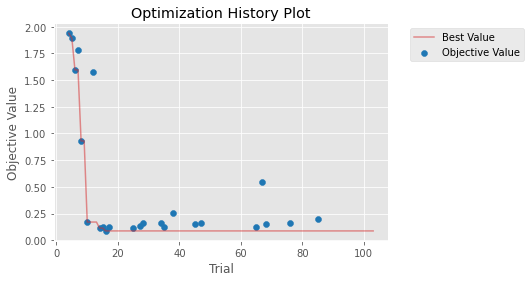

In [213]:
import matplotlib.pyplot as plt
from optuna.visualization.matplotlib import plot_optimization_history

# Assuming 'my_study' is your Optuna study object
fig = plot_optimization_history(my_study)
plt.show()

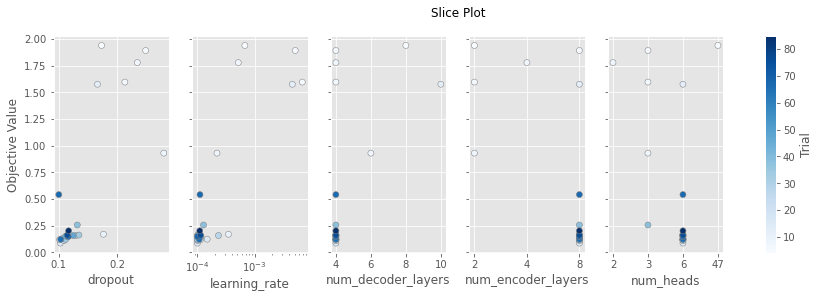

In [214]:
import matplotlib.pyplot as plt
from optuna.visualization.matplotlib import plot_slice

# Assuming 'my_study' is your Optuna study object
fig = plot_slice(my_study)
plt.show()

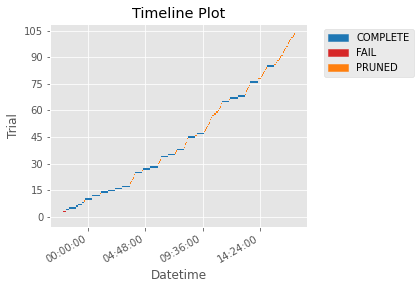

In [215]:
from optuna.visualization.matplotlib import plot_timeline

# Assuming 'my_study' is your Optuna study object
fig = plot_timeline(my_study)
plt.show()